#Librerías

In [ ]:
!pip install pycaret

  Using cached pycaret-3.3.2-py3-none-any.whl.metadata (17 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 11.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.1/486.1 kB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.8/21.8 MB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 29.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 35.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.7/80.7 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━

In [ ]:
!pip install --quiet optuna
!pip install --quiet shap
import shap
import pandas as pd
import numpy as np
import seaborn as sns
sns.set_theme(style = 'dark', palette='Spectral')
import matplotlib.pyplot as plt
import random
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score, classification_report, roc_curve, roc_auc_score, auc
import scipy.stats as stats
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import optuna
# from pycaret.classification import *
import tensorflow as tf
from tensorflow.keras.regularizers import l2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 3.7 MB/s eta 0:00:00


#Parte Uno

##Descarga del dataset

In [ ]:
!gdown 1j1ic5wuePzr5iD5IWEYStsVDVaYg154P
clima = pd.read_csv("weatherAUS.csv", delimiter = ",")

Downloading...
From: https://drive.google.com/uc?id=1j1ic5wuePzr5iD5IWEYStsVDVaYg154P
To: /content/weatherAUS.csv
100% 14.1M/14.1M [00:00<00:00, 33.1MB/s]


In [ ]:
clima.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


##Análisis Exploratorio

Antes de explorar el dataset vamos a filtrarlo para quedarnos con el definitivo: el que usaremos en todo el trabajo práctico al elegir 10 ciudades aleatorias y descartar el resto de los datos.

In [ ]:
clima['Location'].unique(), clima['Location'].unique().size

(array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
        'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
        'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
        'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
        'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
        'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
        'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
        'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
        'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
        'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object),
 49)

De las 49 ciudades de Australia, filtramos:

In [ ]:
ciudades = random.sample(list(clima['Location'].unique()), 10)
ciudades

In [ ]:
ciudades = ['Penrith',
 'PearceRAAF',
 'Melbourne',
 'Portland',
 'Newcastle',
 'Brisbane',
 'Nhil',
 'Ballarat',
 'Mildura',
 'Sydney'] #para guardar la elección y que no varíe el sample en cada ejecución
clima = clima[clima['Location'].isin(ciudades)] #dataset definitivo

In [ ]:
clima.reset_index(drop=True, inplace=True)

In [ ]:
clima

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Newcastle,13.2,NaN,0.0,NaN,NaN,NaN,NaN,NW,...,50.0,24.0,NaN,NaN,3.0,4.0,21.8,30.6,No,No
1,2008-12-02,Newcastle,NaN,32.2,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,59.0,NaN,NaN,NaN,0.0,NaN,25.4,No,No
2,2008-12-03,Newcastle,16.2,32.2,0.0,NaN,NaN,NaN,NaN,N,...,74.0,26.0,NaN,NaN,4.0,4.0,22.2,32.0,No,No
3,2008-12-04,Newcastle,19.2,24.0,0.0,NaN,NaN,NaN,NaN,SE,...,66.0,61.0,NaN,NaN,7.0,5.0,20.4,23.0,No,No
4,2008-12-05,Newcastle,18.8,30.2,0.0,NaN,NaN,NaN,NaN,NE,...,85.0,NaN,NaN,NaN,8.0,NaN,20.0,NaN,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29448,2017-06-21,PearceRAAF,NaN,20.6,NaN,NaN,7.5,NW,43.0,N,...,77.0,50.0,1017.4,1014.0,1.0,1.0,15.6,19.0,NaN,Yes
29449,2017-06-22,PearceRAAF,13.0,18.8,28.8,NaN,0.0,NNE,54.0,NW,...,88.0,74.0,1007.4,1009.4,8.0,8.0,16.5,17.9,Yes,Yes
29450,2017-06-23,PearceRAAF,13.0,19.3,1.4,NaN,6.5,ESE,50.0,E,...,78.0,69.0,1018.4,1019.0,8.0,8.0,15.9,18.0,Yes,No
29451,2017-06-24,PearceRAAF,11.6,18.2,0.0,NaN,9.3,E,48.0,SE,...,69.0,55.0,1025.6,1023.2,NaN,2.0,13.7,16.4,No,No



*   'RainTomorrow' es la variable target y el resto son features


###**Split de datos**

Por simplicidad, antes del split vamos a dropear todos los registros que contengan valores NaN en la target. Seguiremos tratando los valores faltantes más adelante en este trabajo

In [ ]:
clima.isna().sum()

,0
Date,0
Location,0
MinTemp,904
MaxTemp,786
Rainfall,1239
Evaporation,14304
Sunshine,11343
WindGustDir,4424
WindGustSpeed,4424
WindDir9am,2550


In [ ]:
clima.dropna(subset=['RainTomorrow'], inplace=True)

In [ ]:
clima.isna().sum()

,0
Date,0
Location,0
MinTemp,338
MaxTemp,185
Rainfall,396
Evaporation,13872
Sunshine,11159
WindGustDir,4190
WindGustSpeed,4190
WindDir9am,2430


In [ ]:
#Vamos a separar entre la matriz de features y la target
X = clima.drop('RainTomorrow', axis=1)
y = clima['RainTomorrow'].values.reshape(-1,1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convertimos y_train a un DataFrame para poder combinarlo con X_train temporalmente para realizar visualizaciones gráficas
# También queremos a y_test como Dataframe
y_train_df = pd.DataFrame(y_train, columns=['RainTomorrow'])
y_test_df = pd.DataFrame(y_test, columns=['RainTomorrow'])

In [ ]:
#Guardamos los datos así como están para usarlos en el futuro en Docker
X_train.to_csv("X_train.csv", index=False)
y_train_df.to_csv("y_train.csv", index=False)

# Guardar los datos de prueba
X_test.to_csv("X_test.csv", index=False)
y_test_df.to_csv("y_test.csv", index=False)

In [ ]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((23562, 22), (5891, 22), (23562, 1), (5891, 1))

In [ ]:
#Hacemos un reset del indice de X_train para que se correlacione con el indice de y_train_df
X_train.reset_index(drop=True, inplace=True)

In [ ]:
# Concatenamos X_train_scaled con y_train_df
clima_train = pd.concat([X_train, y_train_df], axis=1)

In [ ]:
print(clima_train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23562 entries, 0 to 23561
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           23562 non-null  object 
 1   Location       23562 non-null  object 
 2   MinTemp        22883 non-null  float64
 3   MaxTemp        22965 non-null  float64
 4   Rainfall       22618 non-null  float64
 5   Evaporation    12026 non-null  float64
 6   Sunshine       14428 non-null  float64
 7   WindGustDir    19996 non-null  object 
 8   WindGustSpeed  19996 non-null  float64
 9   WindDir9am     21518 non-null  object 
 10  WindDir3pm     22335 non-null  object 
 11  WindSpeed9am   23274 non-null  float64
 12  WindSpeed3pm   22733 non-null  float64
 13  Humidity9am    22861 non-null  float64
 14  Humidity3pm    22344 non-null  float64
 15  Pressure9am    18231 non-null  float64
 16  Pressure3pm    18214 non-null  float64
 17  Cloud9am       16702 non-null  float64
 18  Cloud3



*   **Estructura del dataset de train: 23 columnas x 23.562 filas**
*   16 variables tipo float y 7 tipo object




In [ ]:
print(clima_train.describe())

            MinTemp       MaxTemp      Rainfall   Evaporation      Sunshine  \
count  22883.000000  22965.000000  22618.000000  12026.000000  14428.000000   
mean      12.010694     22.908308      2.247652      4.948586      7.572761   
std        5.562834      6.727413      7.790778      3.180217      3.813208   
min       -5.600000      4.600000      0.000000      0.000000      0.000000   
25%        7.900000     17.900000      0.000000      2.400000      4.800000   
50%       11.700000     22.400000      0.000000      4.400000      8.400000   
75%       16.200000     27.500000      0.800000      7.000000     10.500000   
max       31.900000     46.900000    240.000000     44.000000     14.500000   

       WindGustSpeed  WindSpeed9am  WindSpeed3pm   Humidity9am   Humidity3pm  \
count   19996.000000  23274.000000  22733.000000  22861.000000  22344.000000   
mean       39.473845     13.552376     17.688690     70.662788     51.653643   
std        14.447493      9.543273      9.420061

Se ve que cada variable real está dentro de un rango coherente (las relacionadas a temperaturas oscilan entre valores negativos y positivos ✔, las relacionadas a nubosidad, lluvias, presión, humedad, velocidad del viento, luz solar y evaporación no tienen valores negativos ✔)


In [ ]:
clima_train_variables = pd.DataFrame([('Date','Fecha de las observaciones','object',(clima_train['Date'].min(), clima_train['Date'].max())),
 ('Location','Ciudad de australia','object', ciudades),
 ('MinTemp','Temperatura mínima en °C','float',(clima_train['MinTemp'].min(), clima_train['MinTemp'].max())),
 ('MaxTemp','Temperatura máxima °C','float',(clima_train['MaxTemp'].min(), clima_train['MaxTemp'].max())),
 ('Rainfall','Precipitación en mm','float',(clima_train['Rainfall'].min(), clima_train['Rainfall'].max())),
 ('Evaporation','Evaporación en mm','float',(clima_train['Evaporation'].min(), clima_train['Evaporation'].max())),
 ('Sunshine','Horas de luz solar por día','float',(clima_train['Sunshine'].min(), clima_train['Sunshine'].max())),
 ('WindGustDir','Dirección de ráfagas de viento en km/h','object',list(clima_train['WindGustDir'].unique())),
 ('WindGustSpeed','Velocidad de ráfagas de viento','float',(clima_train['WindGustSpeed'].min(), clima_train['WindGustSpeed'].max())),
 ('WindDir9am','Dirección del viento a las 9 am','object',list(clima_train['WindDir9am'].unique())),
 ('WindDir3pm','Dirección del viento a las 3 pm','object',list(clima_train['WindDir3pm'].unique())),
 ('WindSpeed9am','Velocidad del viento a las 9 am en km/h','float',(clima_train['WindSpeed9am'].min(), clima_train['WindSpeed9am'].max())),
 ('WindSpeed3pm','Velocidad del viento a las 3 pm en km/h','float',(clima_train['WindSpeed3pm'].min(), clima_train['WindSpeed3pm'].max())),
 ('Humidity9am','% de humedad a las 9 am','float',(clima_train['Humidity9am'].min(), clima_train['Humidity9am'].max())),
 ('Humidity3pm','% de humedad a las 3 pm','float',(clima_train['Humidity3pm'].min(), clima_train['Humidity3pm'].max())),
 ('Pressure9am','Presión atmosférica a las 9 am en hpa','float',(clima_train['Pressure9am'].min(), clima_train['Pressure9am'].max())),
 ('Pressure3pm','Presión atmosférica a las 3 pm en hpa','float',(clima_train['Pressure3pm'].min(), clima_train['Pressure3pm'].max())),
 ('Cloud9am','Nubosidad a las 9 am','float',(clima_train['Cloud9am'].min(), clima_train['Cloud9am'].max())),
 ('Cloud3pm','Nubosidad a las 3 pm','float',(clima_train['Cloud3pm'].min(), clima_train['Cloud3pm'].max())),
 ('Temp9am','Temperatura a las 9 am en °C','float',(clima_train['Temp9am'].min(), clima_train['Temp9am'].max())),
 ('Temp3pm','Temperatura a las 3 pm en °C','float',(clima_train['Temp3pm'].min(), clima_train['Temp3pm'].max())),
 ('RainToday','Indica si llovió hoy','object','[Yes, No]'),
 ('RainTomorrow','Indica si hay lluvia mañana','object','[Yes, No]')],columns=('Variable','Descripción','Tipo_de_dato','Rango_o_valores'))
clima_train_variables

,Variable,Descripción,Tipo_de_dato,Rango_o_valores
0,Date,Fecha de las observaciones,object,"(2008-02-01, 2017-06-25)"
1,Location,Ciudad de australia,object,"[Penrith, PearceRAAF, Melbourne, Portland, New..."
2,MinTemp,Temperatura mínima en °C,float,"(-5.6, 31.9)"
3,MaxTemp,Temperatura máxima °C,float,"(4.6, 46.9)"
4,Rainfall,Precipitación en mm,float,"(0.0, 240.0)"
5,Evaporation,Evaporación en mm,float,"(0.0, 44.0)"
6,Sunshine,Horas de luz solar por día,float,"(0.0, 14.5)"
7,WindGustDir,Dirección de ráfagas de viento en km/h,object,"[NW, WSW, nan, N, E, SW, ENE, S, NNW, W, NNE, ..."
8,WindGustSpeed,Velocidad de ráfagas de viento,float,"(7.0, 122.0)"
9,WindDir9am,Dirección del viento a las 9 am,object,"[N, NW, nan, W, ENE, SSW, NNE, ESE, WSW, SSE, ..."


###Visualizaciones

In [ ]:
columnas_datos_object = clima_train.select_dtypes(include=['object']).columns
columnas_datos_float = clima_train.columns.difference(columnas_datos_object)

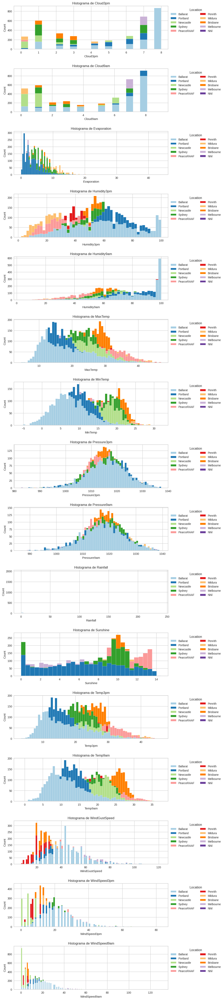

In [ ]:
#Histplots de cada columna con tipo de dato real
fig, axes = plt.subplots(nrows=len(columnas_datos_float), figsize=(10, len(columnas_datos_float)*4))

for ax, columna in zip(axes, columnas_datos_float):
    sns.histplot(data=clima_train, x=columna, hue='Location', alpha=1, palette='Paired', ax=ax)
    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1),ncol=2)
    ax.set_title(f'Histograma de {columna}')

plt.subplots_adjust(hspace=0.45)

A priori se notan varias cosas:
- las variables referidas al viento presentan sesgo a la derecha, al igual que la evaporación
- Rainfall con gráfica muy pequeña. ¿Es por outliers?
- las variables referidas a la presión parecen tener distribución normal
- mucha varianza en variables referidas a la humedad

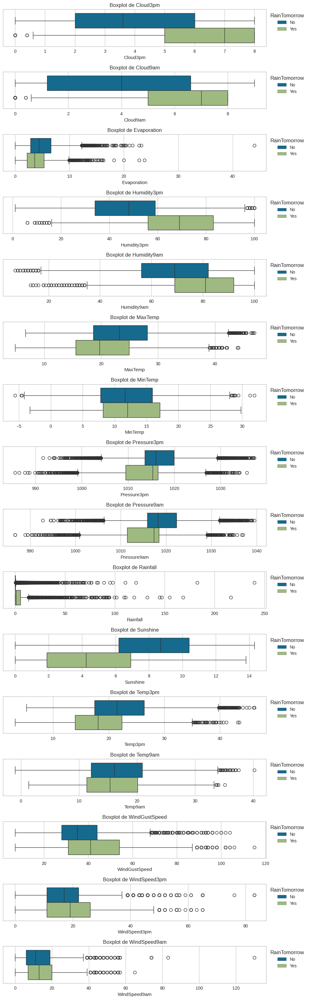

In [ ]:
#Subplots individuales para cada columna
fig, axes = plt.subplots(nrows=len(columnas_datos_float), ncols=1, figsize=(10, 2 * len(columnas_datos_float)))

# Generar un boxplot por cada columna
for i, col in enumerate(columnas_datos_float):
    sns.boxplot(data=clima_train, x=col, ax=axes[i], hue='RainTomorrow')
    sns.move_legend(axes[i], "upper left", bbox_to_anchor=(1, 1))
    axes[i].set_title(f'Boxplot de {col}')

plt.subplots_adjust(hspace=0.45)
plt.tight_layout()

En este gráfico podemos observar los boxplots de cada variable continua separandolos cuando la variable objetivo toma diferentes valores y vemos que las variables relacionadas a la nubosidad, humedad y la cantidad de horas del sol en el día son las que mas variación presentan. Esto puede indicar que tienen una relación considerable con la variable objetivo.

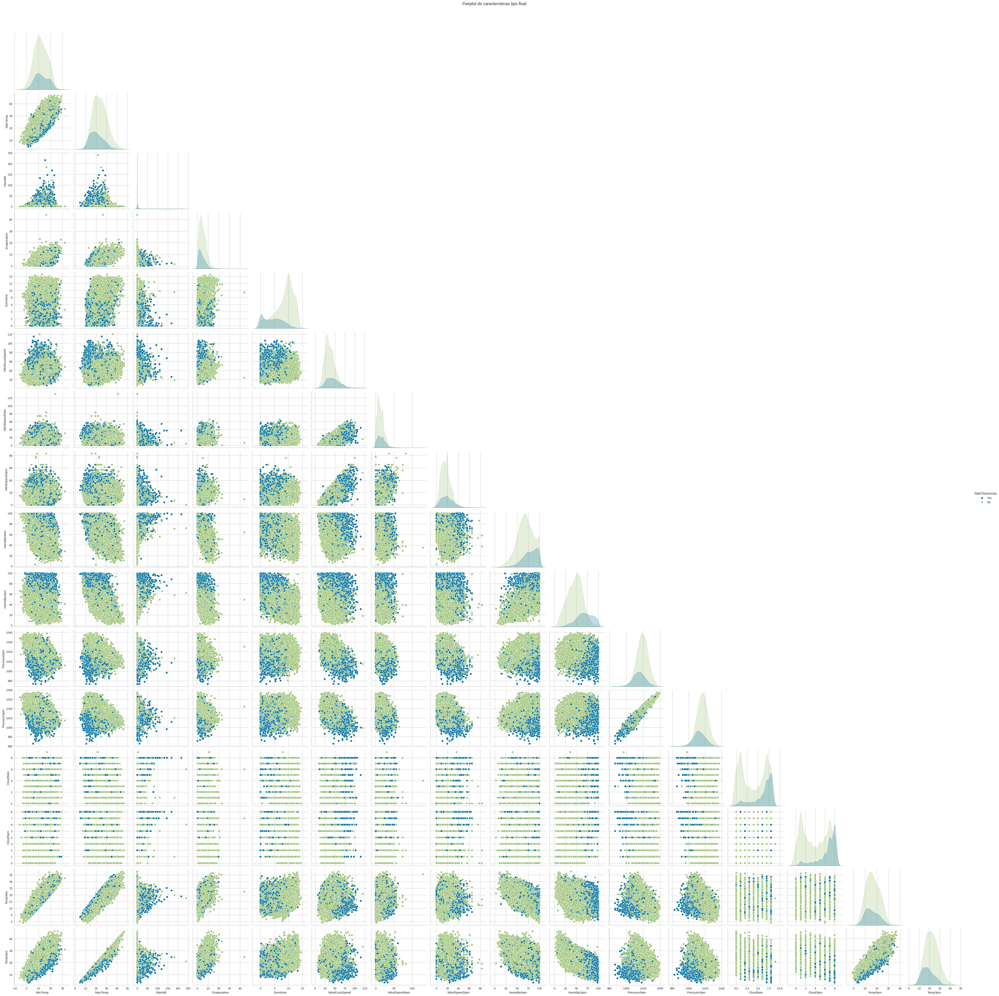

In [ ]:
sns.pairplot(data = clima_train, corner = True, height = 3, hue = 'RainTomorrow')
plt.suptitle('Pairplot de características tipo float', y=1.02)
plt.show()

Podemos notar varias cosas:
- Marcadas relaciones lineales entre las variables que tienen que ver con temperatura
- Comportamiendo bimodal de las features de nubosidad
- Desbalance del dataset con predominancia de los 'No' en RainTomorrow. Vemos:

In [ ]:
#Calculo proporciones en la target
round((clima_train['RainTomorrow'].value_counts(normalize=True))*100,2)

,proportion
RainTomorrow,
No,77.01
Yes,22.99


 **La diferencia entre frecuencias de la variable target nos indica desbalanceo.**  
  Esto es importante saberlo para la determinación de la métrica de medición del modelo de Regresión Logística que haremos más adelante, ya que, es normal que en los modelos desbalanceados se genere una tendencia en las predicciones hacia la variable mayoritaria: 'No' está representada más de tres veces en comparación a 'Yes' haciendo que el modelo pueda terminar aprendiendo a predecir predominantemente cuando no llueve que cuando sí lo hace.

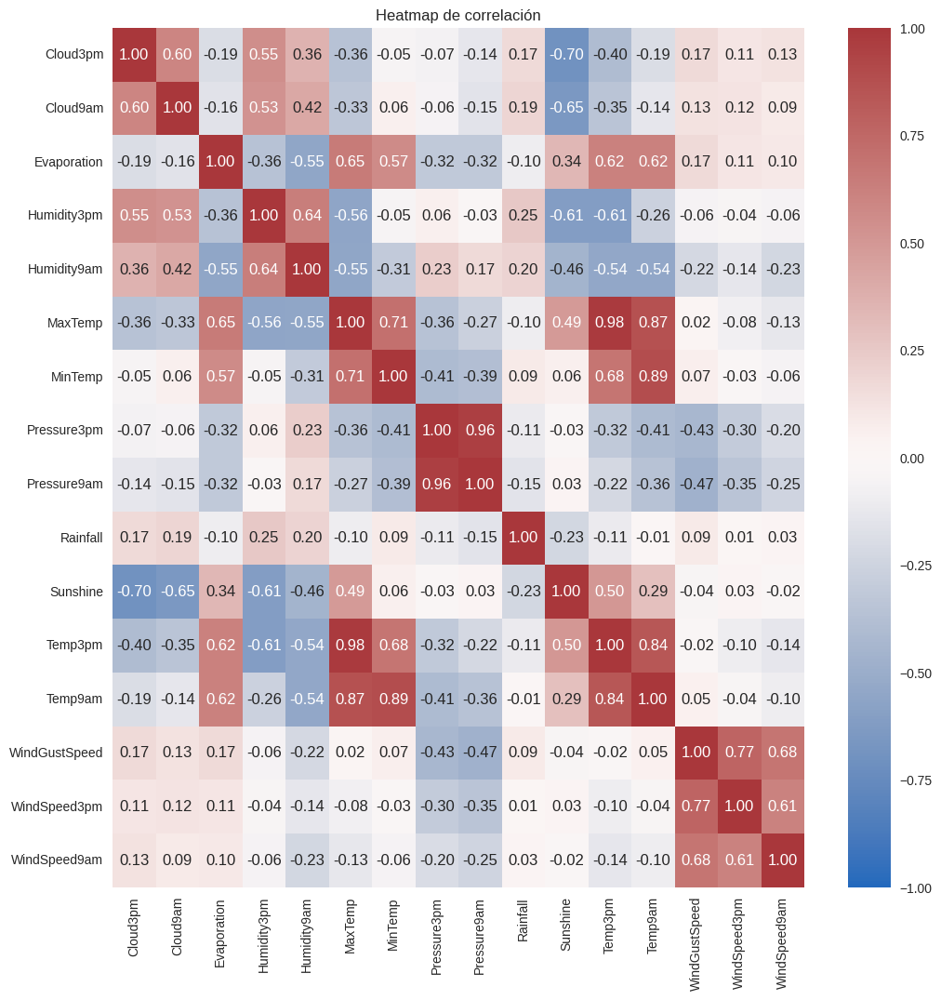

In [ ]:
#Matriz de correlación
corr = clima_train[columnas_datos_float].corr().round(2)
plt.figure(figsize=(12, 12))
sns.heatmap(corr, annot=True, cmap="vlag", fmt='.2f', vmin=-1, vmax=1)
plt.title('Heatmap de correlación')
plt.show()

Como dijimos se nota la relación lineal fuerte entre las features de temperatura (las máximas y mínimas y las que adoptan a las 9 am o 3 pm). Queremos volver a realizar este gráfico una vez codifiquemos las variables categóricas

##Manejo de valores NaN

In [ ]:
clima_train.shape

(22571, 23)

Habían 23562 registros y ahora quedan 22571, así que ya borramos el 4,2% de los datos (991 registros). De hecho, si como máximo estamos dispuestos a perder el 5% de los datos, son 1178 registros aprox. los que podríamos prescindir. Es decir, si seguimos evaluando los NaN, como mucho nos vamos a limitar a borrar unas 187 filas más.

In [ ]:
clima_train[clima_train.isnull().any(axis=1)].shape #cuántos registros tienen algún valor nan

(13811, 23)

In [ ]:
filas_nan = clima_train.isnull().sum(axis=1).value_counts().rename_axis('Cantidad de NaN').rename('Cantidad de filas').sort_index()
filas_nan

,Cantidad de filas
Cantidad de NaN,
0,8760
1,1951
2,3639
3,1497
4,1790
5,126
6,2681
7,1025
8,275


In [ ]:
#conteo de filas que tienen 13 valores nulos o más
filas_nan[13:].sum()

163

163 es menor que nuestro limite de 187 así que procedemos a borrar los registros con 13 valores NaN o más. El resto los vamos a imputar

In [ ]:
#Borramos los registros que contengan 13 valores NaN o más
clima_train.dropna(thresh=len(clima.columns)-12, inplace = True)

##Input de Datos

###Imputación variables continuas

  Para las variables continuas vamos a usar diferentes imputadores para completar los valores faltantes de las columnas. Para las que tengan una distribucion normal o semejante useremos el SimpleImputer y para aquellos que tengan una distribucion diferente utilizaremos el knnImputer. Esto lo decidimos viendo el histograma y pairplot de cada variable hecho previamente con un analisis utilizando el metodo de Quartil-Quartil para encontrar distribuciones normales

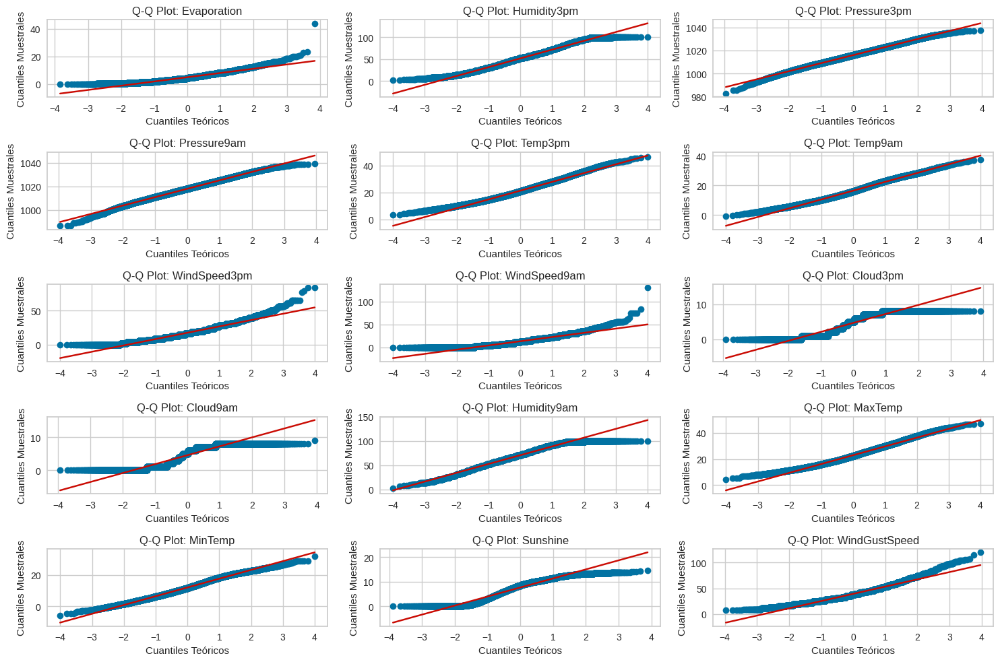

In [ ]:
#Lista de columnas a analizar
columnas = ["Evaporation","Humidity3pm","Pressure3pm","Pressure9am","Temp3pm","Temp9am","WindSpeed3pm","WindSpeed9am","Cloud3pm","Cloud9am","Humidity9am","MaxTemp","MinTemp","Sunshine","WindGustSpeed"]

plt.figure(figsize=(15, 10))
num_cols = len(columnas)

for i, columna in enumerate(columnas, 1):
    plt.subplot(5, 3, i)
    datos_sin_nan = clima_train[columna].dropna()
    stats.probplot(datos_sin_nan, dist="norm", plot=plt)
    plt.title(f"Q-Q Plot: {columna}")
    plt.xlabel("Cuantiles Teóricos")
    plt.ylabel("Cuantiles Muestrales")

plt.tight_layout()
plt.show()


Teniendo la información de estos graficos más los anteriores nombrados, concluimos que las que mejor se adaptan a una distribucion normal son: Pressure3pm, Pressure9am, Temp3pm, Temp9am, MinTemp, MaxTemp

In [ ]:
dist_normal_imputar = [
    "Pressure3pm",
    "Pressure9am",
    "Temp3pm",
    "Temp9am",
    "MinTemp",
    "MaxTemp"
]
imputer = SimpleImputer(strategy='median')
#Imputar las columnas seleccionadas tanto en el conjunto de training como en el de test
clima_train[dist_normal_imputar] = imputer.fit_transform(clima_train[dist_normal_imputar])
X_test[dist_normal_imputar] = imputer.transform(X_test[dist_normal_imputar])

El resto de las variables continuas las imputaremos con KNNImputer

In [ ]:
dist_no_norm_imputar = [
    "Evaporation",
    "Rainfall",
    "Humidity3pm",
    "WindSpeed3pm",
    "WindSpeed9am",
    "Cloud3pm",
    "Cloud9am",
    "Humidity9am",
    "Sunshine",
    "WindGustSpeed"
]
imputer = KNNImputer()

clima_train[dist_no_norm_imputar] = imputer.fit_transform(clima_train[dist_no_norm_imputar])
X_test[dist_no_norm_imputar] = imputer.transform(X_test[dist_no_norm_imputar])

###Imputación variables categóricas

####Variables Wind

In [ ]:
#Imputamos en base a un muestreo aleatorio: obtenemos valores únicos (direcciones del viento, en este caso) y las frecuencias relativas (probs) de estos valores
clima_train_wind = clima_train[["WindDir3pm","WindDir9am","WindGustDir"]]
X_test_wind = X_test[["WindDir3pm","WindDir9am","WindGustDir"]]

for col in clima_train_wind.columns:
    values = clima_train_wind[col].value_counts().index.values  #Valores únicos
    probs = clima_train_wind[col].value_counts(normalize=True).values  #Probabilidades
    clima_train_wind[col].replace(np.nan, np.random.choice(a=values, p=probs), inplace=True)
    X_test_wind[col].replace(np.nan, np.random.choice(a=values, p=probs), inplace=True)

In [ ]:
# Reemplazar las columnas en clima_train
for col in clima_train_wind.columns:
    clima_train[col] = clima_train_wind[col]

# Reemplazar las columnas en X_test
for col in X_test_wind.columns:
    X_test[col] = X_test_wind[col]

####Imput RainToday

In [ ]:
#Misma metodología que con Wind
rain_today_prob = clima_train['RainToday'].value_counts(normalize=True)

clima_train['RainToday'].replace(np.nan, np.random.choice(rain_today_prob.index, p=rain_today_prob.values), inplace=True)
X_test['RainToday'].replace(np.nan, np.random.choice(rain_today_prob.index, p=rain_today_prob.values), inplace=True)

In [ ]:
clima_train['RainToday'].replace(np.nan, np.random.choice(a=values, p=probs), inplace=True)

In [ ]:
X_test.isna().sum(), clima_train.isna().sum()

(Date             0
 Location         0
 MinTemp          0
 MaxTemp          0
 Rainfall         0
 Evaporation      0
 Sunshine         0
 WindGustDir      0
 WindGustSpeed    0
 WindDir9am       0
 WindDir3pm       0
 WindSpeed9am     0
 WindSpeed3pm     0
 Humidity9am      0
 Humidity3pm      0
 Pressure9am      0
 Pressure3pm      0
 Cloud9am         0
 Cloud3pm         0
 Temp9am          0
 Temp3pm          0
 RainToday        0
 dtype: int64,
 Date             0
 Location         0
 MinTemp          0
 MaxTemp          0
 Rainfall         0
 Evaporation      0
 Sunshine         0
 WindGustDir      0
 WindGustSpeed    0
 WindDir9am       0
 WindDir3pm       0
 WindSpeed9am     0
 WindSpeed3pm     0
 Humidity9am      0
 Humidity3pm      0
 Pressure9am      0
 Pressure3pm      0
 Cloud9am         0
 Cloud3pm         0
 Temp9am          0
 Temp3pm          0
 RainToday        0
 RainTomorrow     0
 dtype: int64)

In [ ]:
#Hasta acá guardamos los datos de train y test para usarlos luego en AutoML
clima_train_aml = clima_train
X_test_aml = X_test
y_test_aml = y_test

##Extracción variable Mes

En el dataset tenemos la variable 'Date', pero la lluvia es algo que podríamos independizar del año debido a que a lo largo de los mismos se notan periodos de mayores o menor presencias de lluvias. Queremos verificar esto con un gráfico. Nos podríamos quedar solamente con el mes?

In [ ]:
periodicidad_lluvias = clima_train.copy()
periodicidad_lluvias['month'] = periodicidad_lluvias.Date.apply(lambda x: int(str(x)[5:7]))
periodicidad_lluvias[['Date', 'month']].head()

,Date,month
0,2010-12-03,12
1,2011-01-27,1
2,2011-02-04,2
3,2016-06-30,6
4,2013-06-20,6


In [ ]:
#Convierte 'RainToday' a numérico (1 = 'Yes', 0 = 'No')
periodicidad_lluvias['RainToday'] = periodicidad_lluvias['RainToday'].map({'Yes': 1, 'No': 0})

#Ahora agrupa por mes y calcula el promedio de 'RainToday'
periodicidad_agrupada = periodicidad_lluvias[['Cloud3pm', 'Cloud9am', 'Evaporation', 'Humidity3pm', 'Humidity9am',
       'MaxTemp', 'MinTemp', 'Pressure3pm', 'Pressure9am', 'Rainfall',
       'Sunshine', 'Temp3pm', 'Temp9am', 'WindGustSpeed', 'WindSpeed3pm',
       'WindSpeed9am','RainToday','month']].groupby('month').mean() #dejamos todas las columnas menos las categóricas para agrupar x la media

periodicidad_agrupada[['RainToday']]

,RainToday
month,
1,0.163214
2,0.183922
3,0.206660
4,0.222601
5,0.229247
6,0.285714
7,0.283360
8,0.265929
9,0.248891


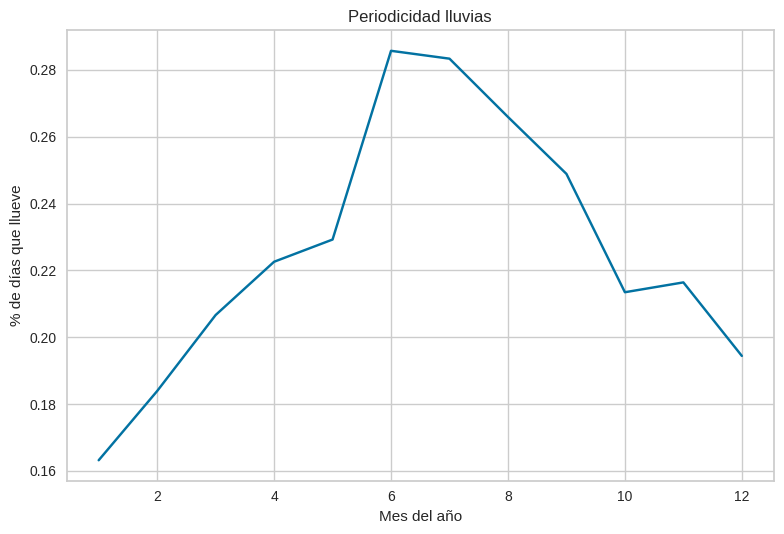

In [ ]:
sns.lineplot(data=periodicidad_agrupada, x=periodicidad_agrupada.index, y='RainToday')
plt.title('Periodicidad lluvias')
plt.xlabel('Mes del año')
plt.ylabel('% de días que llueve')
plt.tight_layout()

Se nota que sí siguen una tendencia las lluvias a lo largo de un año: van en aumento hacia el mes de julio y hasta diciembre se produce un paulatino descenso. Esto nos sustenta la idea de simplificar la variable Date quedándonos con el mes

In [ ]:
#Extraigo el mes de la columna Date
clima_train['Date'] = pd.to_datetime(clima_train['Date'])
clima_train['Month'] = clima_train['Date'].dt.month
X_test['Date'] = pd.to_datetime(X_test['Date'])
X_test['Month'] = X_test['Date'].dt.month
#Elimino la columna Date original
clima_train.drop(columns=['Date'], inplace=True)
X_test.drop(columns=['Date'], inplace=True)

##Creación variables Dummies

In [ ]:
categorical_columns = ['Location','RainTomorrow', 'RainToday', 'WindDir3pm', 'WindDir9am', 'WindGustDir']

# Aplicar get_dummies a las columnas categóricas, eliminando una categoría por cada una con drop_first=True
clima_dummies = pd.get_dummies(clima_train, columns=categorical_columns, drop_first=True)
X_test = pd.get_dummies(X_test, columns=categorical_columns.remove('RainTomorrow'), drop_first=True)

In [ ]:
#vamos a convertir todos los true y false de clima_dummies a 1 y 0:
clima_dummies = clima_dummies.replace({True: 1, False: 0})
X_test = X_test.replace({True: 1, False: 0})
y_test = np.where(y_test == 'Yes', 1, 0)

##Estandarización de datos

In [ ]:
#Volvemos a dividir clima_train
X_train = clima_dummies.drop('RainTomorrow_Yes', axis=1)
y_train = clima_dummies['RainTomorrow_Yes']
#convierto y_train en un dataframe
y_train = pd.DataFrame(y_train, columns=['RainTomorrow_Yes'])

In [ ]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((22408, 72), (22408, 1), (5643, 72), (5643, 1))

In [ ]:
X_test = X_test[X_train.columns] #esta línea es para que las columnas queden en el mismo orden en ambos datasets

In [ ]:
#Como no tratamos los valores atípicos, vamos a escalar con RobustScaler
scaler = RobustScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

##Modelo Regresion Logistica

In [ ]:
model_lr = LogisticRegression(class_weight='balanced', random_state=42)

Modelo con todas las features

In [ ]:
model_lr.fit(X_train_scaled, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = model_lr.predict(X_test_scaled)
#paso a dataframe
y_pred = pd.DataFrame(y_pred, columns=['RainTomorrow_Yes'])

###Métricas

Matriz de Confusión:



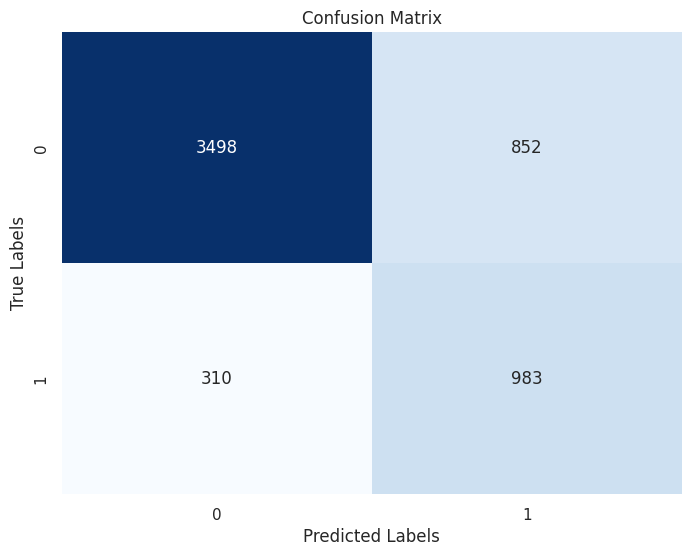


Informe de Clasificación:
               precision    recall  f1-score   support

           0       0.92      0.80      0.86      4350
           1       0.54      0.76      0.63      1293

    accuracy                           0.79      5643
   macro avg       0.73      0.78      0.74      5643
weighted avg       0.83      0.79      0.81      5643



In [ ]:
matriz_confusion = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(matriz_confusion, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
#Calcula el informe de clasificación
informe_clasificacion = classification_report(y_test, y_pred)

# Imprime las métricas
print("Matriz de Confusión:\n")
plt.show()
print("\nInforme de Clasificación:\n", informe_clasificacion)

De la matriz de confusión se puede ver que nuestro modelo tiene 852 falsos positivos y 310 falsos negativos. Esto significa que el modelo predijo 310 veces que no llovia pero llovió. Por otra parte, el modelo predijo 852 veces que llovía pero no llovió.

Al ser un dataset desbalanceado no vamos a tener en cuenta el accuracy porque no es una métrica adecuada.  
Si nos fijamos en el **recall** vemos que el 80% de las veces que no llueve, nuestro modelo predice que no llueve.  
En el caso de los dias que sí llueve, el modelo lo predice un 76% de las veces.  
Mirando la **precision** del modelo, observamos que cuando predecimos que no llueve, en el 92% de los casos la predicción es correcta.  
En el caso que nuestro modelo prediga que llueve, en el 54% de los casos esa prediccion es correcta.  
Teniendo en cuenta estas metricas, nuestro modelo es muy confiable a la hora de predecir los dias que no llueve, pero a la hora de predecir cuando sí llueve, las probabilidades que sea cierto son equivalentes a tirar una moneda al aire.
En conclusion el modelo es mejor para hacer predicciones sobre la clase False (que es la mayoritaria) que sobre la clase True. Esto lo esperabamos por el desbalanceo que habiamos percibido en el dataset.  


Evaluamos sobreajuste:

In [ ]:
y_train_pred = model_lr.predict(X_train_scaled)

#F1-score para los conjuntos de entrenamiento y prueba
f1_train_lr = f1_score(y_train, y_train_pred, average='weighted')
f1_test_lr = f1_score(y_test, y_pred, average='weighted')

print(f'F1-score en el conjunto de entrenamiento: {f1_train_lr:.2f}')
print(f'F1-score en el conjunto de prueba: {f1_test_lr:.2f}')

F1-score en el conjunto de entrenamiento: 0.81
F1-score en el conjunto de prueba: 0.81


Obtuvimos iguales métricas para el conjunto de train y test: indica buena generalización: no parece haber sobreajuste ni subajuste

###Curva ROC

In [ ]:
# Obtengo las probabilidades de predicción del modelo
y_probs = model_lr.predict_proba(X_test_scaled)[:, 1]

# Calculo la ROC y el AUC
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

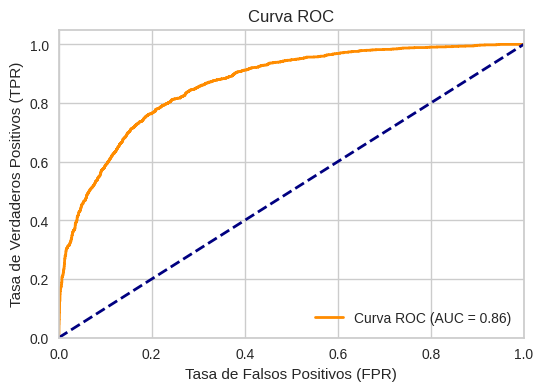

In [ ]:
# Grafico la curva ROC
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

Entendemos que el mejor umbral es el que tiene la mínima distancia al punto (0,1), lo buscamos:


In [ ]:
#Calcular el índice de Youden (TPR - FPR) para cada umbral
youden_index = tpr - fpr

# Encontrar el índice del mejor umbral
best_threshold_index = youden_index.argmax()

# Obtener el mejor umbral
best_threshold = thresholds[best_threshold_index]

print("El mejor umbral es:", round(best_threshold,2))

El mejor umbral es: 0.47


Otra forma de buscar el valor puntual del umbral:

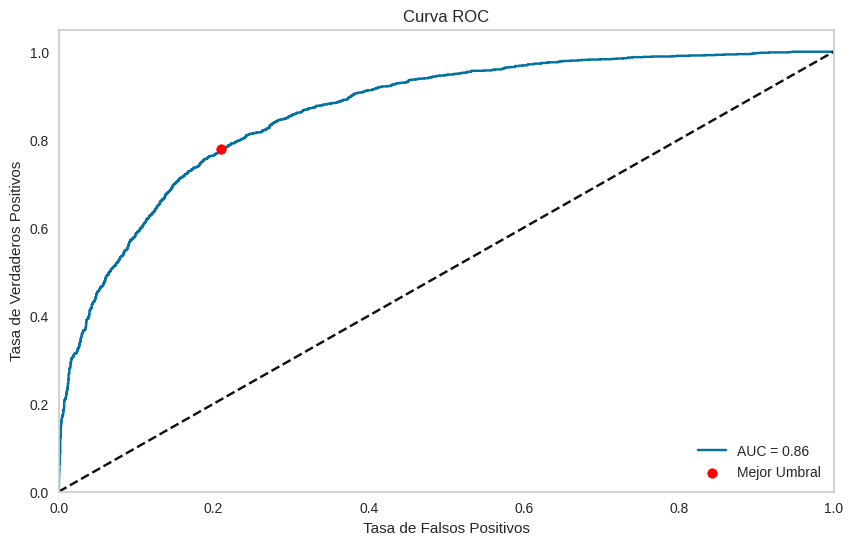

El mejor umbral es: 0.47


In [ ]:
# Calcular el AUC
auc = roc_auc_score(y_test,y_probs)

# Calcular la distancia a (0, 1)
distances = np.sqrt(fpr**2 + (1 - tpr)**2)

# Encontrar el índice
best_index = np.argmin(distances)
best_threshold = thresholds[best_index]

# Graficar la curva ROC
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'AUC = {auc:.2f}')
plt.scatter(fpr[best_index], tpr[best_index], color='red', label='Mejor Umbral', zorder=5)
plt.plot([0, 1], [0, 1], 'k--')  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Imprimir el mejor umbral
print(f'El mejor umbral es: {best_threshold:.2f}')

Obtuvimos el mismo umbral con ambos métodos, no hubo diferencia.

##Modelo Base

In [ ]:
def modelo_base(y_train, l):
    # Calcular la probabilidad de cada clase
    prob_true = y_train.mean()  # Proporción de True
    prob_false = 1 - prob_true   # Proporción de False

    # Generar valores aleatorios basados en las probabilidades
    # np.random.choice elige entre True y False según las probabilidades
    y_pred = np.random.choice([True, False], size=l, p=[prob_true, prob_false])

    # Devolver una serie con el mismo formato que y_train
    return pd.Series(y_pred)

In [ ]:
modelo_base_pred = modelo_base(y_train.squeeze(), len(y_test)) #squeeze para pasar serie en vez de dataframe

###Métricas

In [ ]:
confusion_matrix = confusion_matrix(y_test, modelo_base_pred)

classification_report_model = classification_report(y_test, modelo_base_pred)

# Imprimir métricas
print("Métricas para nuestro modelo:")
print("Matriz de confusión:")
print(confusion_matrix)
print("Reporte de clasificación:")
print(classification_report_model)

Métricas para nuestro modelo:
Matriz de confusión:
[[3361  989]
 [ 984  309]]
Reporte de clasificación:
              precision    recall  f1-score   support

           0       0.77      0.77      0.77      4350
           1       0.24      0.24      0.24      1293

    accuracy                           0.65      5643
   macro avg       0.51      0.51      0.51      5643
weighted avg       0.65      0.65      0.65      5643



De la matriz de confusión se puede ver que nuestro modelo tiene 989 falsos positivos y 984 falsos negativos
La precisión para la clase True (cuando se espera lluvia) es baja (24%), lo que sugiere que el modelo tiene dificultades para identificar correctamente los días de lluvia. El recall para esta clase también es bajo (24%), lo que significa que solo una pequeña proporción de los días lluviosos fue correctamente identificada.

La matriz de confusión revela que hay un alto número de falsos negativos: el modelo tiende a predecir incorrectamente días de lluvia como días sin lluvia. Es más efectivo para predecir días sin lluvia (clase False) que para días con lluvia (clase True).

In [ ]:
#Nos guardamos las métricas de f1_score para comparar al final del tp
modelo_base_train = modelo_base(y_train.squeeze(), len(y_train))

# Calcular métricas F1 para train y test
f1_train_base = f1_score(y_train, modelo_base_train, average='weighted')
f1_test_base = f1_score(y_test, modelo_base_pred, average='weighted')

print(f'F1-score en el conjunto de entrenamiento: {f1_train_base:.2f}')
print(f'F1-score en el conjunto de prueba: {f1_test_base:.2f}')

F1-score en el conjunto de entrenamiento: 0.65
F1-score en el conjunto de prueba: 0.65


##Conclusión Parte 1

Como conclusión, constatamos que el modelo base es peor que el de regresión logística y que solo nos servirá de referencia para comparar el resto de los modelos. Veremos siempre **UNA SOLA MEDIDA DE COMPARACIÓN**: nosotros decidimos enfocarnos en F1 Score. En el modelo base hay 77% de clase False y 24% de True, mientras que en RL es 86% y 63% respectivamente, además de tener un umbral cercano a 0.5 y un AUC de 0.86 (cercano a 1). En datos de test obtuvimos 65% para el primero y 81% para el segundo.

#Parte Dos


##Optimización de hiperparametros

Propuesta de parámetros:

In [ ]:
params = [
    {'penalty': ['l2','l1','elasticnet', None],
    "C": [0.1, 1, 10,100],
    "solver": ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
    "max_iter": [50, 100, 200, 500]}
]

Si bien vimos en el apartado de métricas del modelo de regresión logística que no estaríamos en presencia de sub o sobreajuste con el modelo que probamos, vamos a experimentar incorporando 'penalty' y 'c' para ver si de hecho obtenemos una mejora adicional en la generalización del modelo de RL. También incorporamos 'solver' que está directamente relacionado con 'penalty', y 'max_iter' para saber cuántas iteraciones necesitaría el modelo para converger

Como nos quedó una grilla que tiene muchas combinaciones posibles ( < 256) empezamos probando con random search y evitar una búsqueda exhaustiva con grid search que sabemos nos llevará mucho tiempo. Aprovechamos agregando un valor de cv directamente en esta búsqueda

In [ ]:
#random search
random_search = RandomizedSearchCV(LogisticRegression(class_weight='balanced'),
                                   params,
                                   n_iter=30,
                                   cv=5,
                                   scoring='f1',
                                   n_jobs=-1,
                                   random_state = 42)# n_jobs=-1 si quisieramos mejorar el tiempo de ejecucion
random_search.fit(X_train_scaled, y_train)
best_random_params = random_search.best_params_

In [ ]:
random_search.best_params_

{'solver': 'lbfgs', 'penalty': 'l2', 'max_iter': 500, 'C': 100}

In [ ]:
best_random_params = {'solver': 'lbfgs', 'penalty': 'l2', 'max_iter': 500, 'C': 100}

In [ ]:
y_pred_rs = random_search.predict(X_test_scaled)
print(classification_report(y_test, y_pred_rs))

              precision    recall  f1-score   support

           0       0.92      0.80      0.86      4350
           1       0.54      0.76      0.63      1293

    accuracy                           0.79      5643
   macro avg       0.73      0.78      0.74      5643
weighted avg       0.83      0.79      0.81      5643



In [ ]:
best_random_model = LogisticRegression(class_weight='balanced', **best_random_params, random_state=42)
best_random_model.fit(X_train_scaled, y_train)

LogisticRegression(C=100, class_weight='balanced', max_iter=500,
                   random_state=42)

In [ ]:
f1_test_lr_rs = f1_score(y_test, best_random_model.predict(X_test_scaled),average = 'weighted')
f1_train_lr_rs = f1_score(y_train, best_random_model.predict(X_train_scaled),average = 'weighted')
print(f"F1-score del modelo con random search en datos de test: {f1_test_lr_rs}")
print(f"F1-score del modelo con random search en datos de train: {f1_train_lr_rs}")

F1-score del modelo con random search en datos de test: 0.8052623900612771
F1-score del modelo con random search en datos de train: 0.8111613420480553


A modo de experimentación en este TP, probamos con optuna también para ver qué resultados obtenemos utilizando esta técnica más avanzada

In [ ]:
#Split para realizar validación cruzada en optuna
X_train_cv, X_val_cv, y_train_cv, y_val_cv = train_test_split(X_train_scaled, y_train, test_size=0.2, random_state=42)

In [ ]:
#Optuna
def train_evaluate_model(params, X_train, y_train, X_val, y_val):
    model = LogisticRegression(class_weight='balanced', **params, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    f1 = f1_score(y_val, y_pred)
    return f1

def objective(trial):
    #combinaciones válidas de solver y penalty
    solver_penalty_combinations = [
        ('lbfgs', 'l2'),
        ('liblinear', 'l1'),
        ('liblinear', 'l2'),
        ('newton-cg', 'l2'),
        ('newton-cg', None),
        ('newton-cholesky', 'l2'),
        ('newton-cholesky', None),
        ('sag', 'l2'),
        ('saga', 'l1'),
        ('saga', 'l2'),
        ('saga', 'elasticnet'),
        ('saga', None),
    ]

    # Sugerir una combinación de solver y penalty
    solver, penalty = trial.suggest_categorical('solver_penalty', solver_penalty_combinations)

    C = trial.suggest_float('C', 0.1, 1000, log=True)
    max_iter = trial.suggest_int('max_iter', 20, 1000)

    # Si el penalizador es elasticnet, sugerir l1_ratio
    l1_ratio = None
    if penalty == 'elasticnet':
        l1_ratio = trial.suggest_float('l1_ratio', 0.0, 1.0)

    params = {
        'penalty': penalty,
        'C': C,
        'solver': solver,
        'max_iter': max_iter,
        'l1_ratio': l1_ratio  # Será None si no es necesario
    }
    #Entrenar y evaluar el modelo
    f1 = train_evaluate_model(params, X_train_cv, y_train_cv, X_val_cv, y_val_cv)
    return f1

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)
best_optuna_params = study.best_params
print(f"Best hyperparameters: {best_optuna_params}")

[I 2024-12-13 01:15:27,441] A new study created in memory with name: no-name-e0c57617-b3e6-4bbc-b51a-295fa9d424fb
[I 2024-12-13 01:15:27,774] Trial 0 finished with value: 0.6222041480276536 and parameters: {'solver_penalty': ('liblinear', 'l2'), 'C': 30.201588394851147, 'max_iter': 495}. Best is trial 0 with value: 0.6222041480276536.
[I 2024-12-13 01:15:28,021] Trial 1 finished with value: 0.6222041480276536 and parameters: {'solver_penalty': ('newton-cholesky', 'l2'), 'C': 67.57562233905855, 'max_iter': 497}. Best is trial 0 with value: 0.6222041480276536.
[I 2024-12-13 01:15:28,314] Trial 2 finished with value: 0.6228177019894438 and parameters: {'solver_penalty': ('liblinear', 'l2'), 'C': 0.2739171883736803, 'max_iter': 90}. Best is trial 2 with value: 0.6228177019894438.
[I 2024-12-13 01:15:28,639] Trial 3 finished with value: 0.6222041480276536 and parameters: {'solver_penalty': ('liblinear', 'l2'), 'C': 666.2301991538088, 'max_iter': 60}. Best is trial 2 with value: 0.6228177019

Best hyperparameters: {'solver_penalty': ('liblinear', 'l1'), 'C': 0.3269256705088624, 'max_iter': 420}


In [ ]:
best_optuna_params

{'solver_penalty': ('liblinear', 'l1'),
 'C': 0.3269256705088624,
 'max_iter': 420}

In [ ]:
#Guardamos el diccionario para quedarnos con las mismas métricas en cada ejecución del tp
best_optuna_params = {'solver': 'liblinear',
  'C': 0.3269256705088624,
 'max_iter': 420,
 'penalty': 'l1'}

In [ ]:
best_optuna_model = LogisticRegression(class_weight='balanced', **best_optuna_params, random_state=42)
best_optuna_model.fit(X_train_scaled, y_train)
y_pred = best_optuna_model.predict(X_test_scaled)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.81      0.86      4350
           1       0.54      0.76      0.63      1293

    accuracy                           0.79      5643
   macro avg       0.73      0.78      0.74      5643
weighted avg       0.83      0.79      0.81      5643



In [ ]:
f1_test_lr_opt = f1_score(y_test, best_optuna_model.predict(X_test_scaled),average = 'weighted')
f1_train_lr_opt = f1_score(y_train, best_optuna_model.predict(X_train_scaled),average = 'weighted')
print(f"F1-score del modelo con optuna en datos de test: {f1_test_lr_opt:.4f}")
print(f"F1-score del modelo con optuna en datos de train: {f1_train_lr_opt:.4f}")

F1-score del modelo con optuna en datos de test: 0.8058
F1-score del modelo con optuna en datos de train: 0.8116


Vemos que no es superador de RandomSearch. Pareciera que el modelo no mejora más, que ya está trabajando de forma óptima, porque a pesar de haber ampliado los rangos de búsqueda en Optuna simplemente obtuvimos métricas similares (siempre observando f1-score) que RS.

##SHAP

Ahora realizaremos un analisis de explicabilidad del modelo para entender que es lo que evalua a la hora de predecir si un dia llueve o no.

In [ ]:
feature_names = X_train_scaled.columns.values

In [ ]:
explainer = shap.LinearExplainer(best_optuna_model, X_train_scaled, feature_names=feature_names)

###Interpretabilidad **Local**

Vamos a analizar los dias que nuestro modelo predice con mayor probabilidad el valor de RainTomorrow. Buscaremos el índice en donde la probabilidad de que pertenezca a la clase 0(False) sea la mayor y haremos lo mismo para la clase 1(True)

In [ ]:
# Calcula los valores SHAP para un conjunto de prueba
shap_values = explainer.shap_values(X_test_scaled)

In [ ]:
probabilidades = model_lr.predict_proba(X_test_scaled)

In [ ]:
menor_prob_lluvia_idx = np.argmax(probabilidades[:, 0])
menor_prob = model_lr.predict_proba(X_test_scaled)[menor_prob_lluvia_idx]

print(f"Índice del valor mas grande de probabilidad de pertencencia a clase 0: {menor_prob_lluvia_idx}\nSu probabilidad es: {round(menor_prob[0],3)}%")

Índice del valor mas grande de probabilidad de pertencencia a clase 0: 5616
Su probabilidad es: 0.995%


In [ ]:
explanation = shap.Explanation(values=shap_values[menor_prob_lluvia_idx],
                               base_values=explainer.expected_value,
                               feature_names=feature_names)

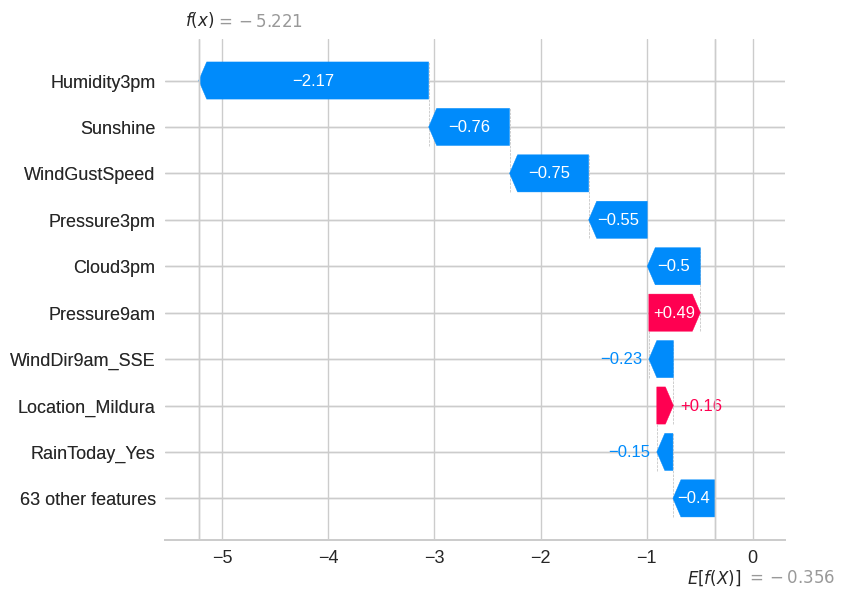

In [ ]:
shap.plots.waterfall(explanation, max_display=10)

De este gráfico podemos analizar el día que nuestro modelo predijo con mas certeza que RainTomorrow tenía valor False. Vemos que para hacer esa predicción le dió mucho peso a la variable Humidity3pm, a la cantidad de horas de sol y a la velocidad de las ráfagas de viento.

In [ ]:
#Ahora realizamos lo mismo para el día que asignó con mayor probabilidad de que RainTomorrow sea True
mayor_prob_lluvia_idx = np.argmax(probabilidades[:, 1])
explanation = shap.Explanation(values=shap_values[mayor_prob_lluvia_idx],
                               base_values=explainer.expected_value,
                               feature_names=feature_names)

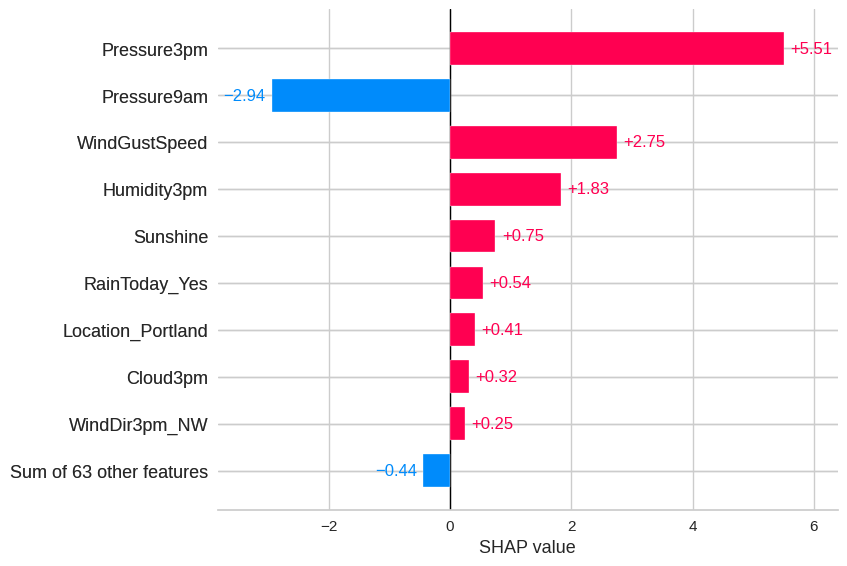

In [ ]:
shap.plots.bar(explanation)

Observando el gráfico podemos distinguir ciertas diferencias con el anterior. Para el caso donde nuestro modelo asignó con mayor certeza que RainTomorrow era True, le dio mucha importancia a las variables de presion sobre todo. Luego vienen WindGustSpeed, Humidity3pm y Sunshine, similar a los resultados anteriores.

###Interpretabilidad **Global**

Ahora veremos que variables nuestro modelo considera más importantes cuando se analiza todo el conjunto de prueba entero.

In [ ]:
global_explanation = shap.Explanation(values=shap_values, base_values=explainer.expected_value, feature_names=feature_names, data=X_test_scaled)

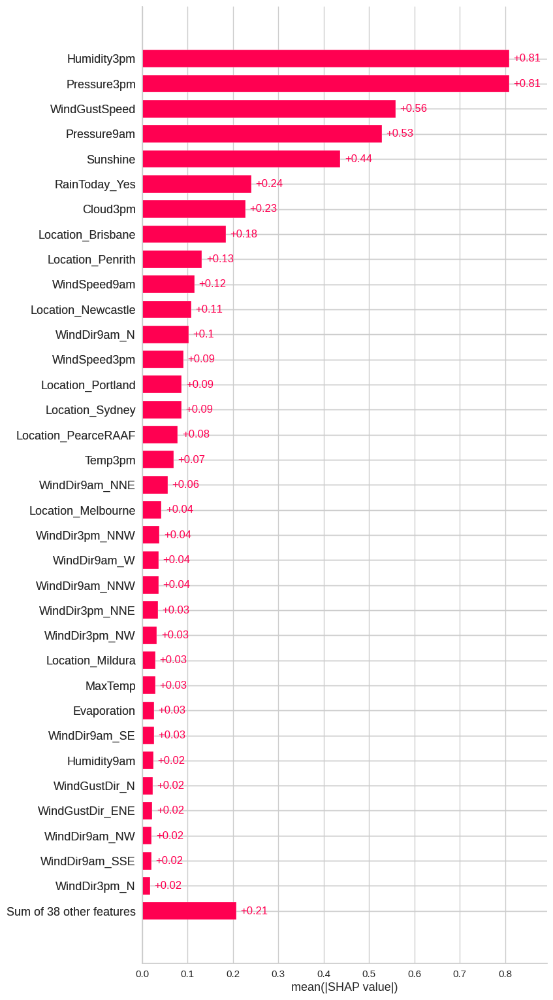

In [ ]:
shap.plots.bar(global_explanation, max_display = 35)

Viendo este gráfico podemos ver que las variables que nuestro modelo considera mas importantes son: Humidity3pm, Pressure3pm, WindGustSpeed, Pressure9am, Sunshine, y si llovió hoy.  
Podemos concluir que lo que más afecta cuando consideramos si el día de mañana va a llover es la presion atmosferica, la humedad, la velocidad de las ráfagas de viento, y la cantidad de horas de sol, dándole importancia a los valores obtenidos por la tarde (3pm) por sobre la mañana.
Por otra parte podemos ver que las siguientes variables más importantes tienen que ver con las diferentes Locations, lo cual nos puede dar una idea de que diferentes lugares geograficos tienen una variación importante en la cantidad de dias de lluvia.  

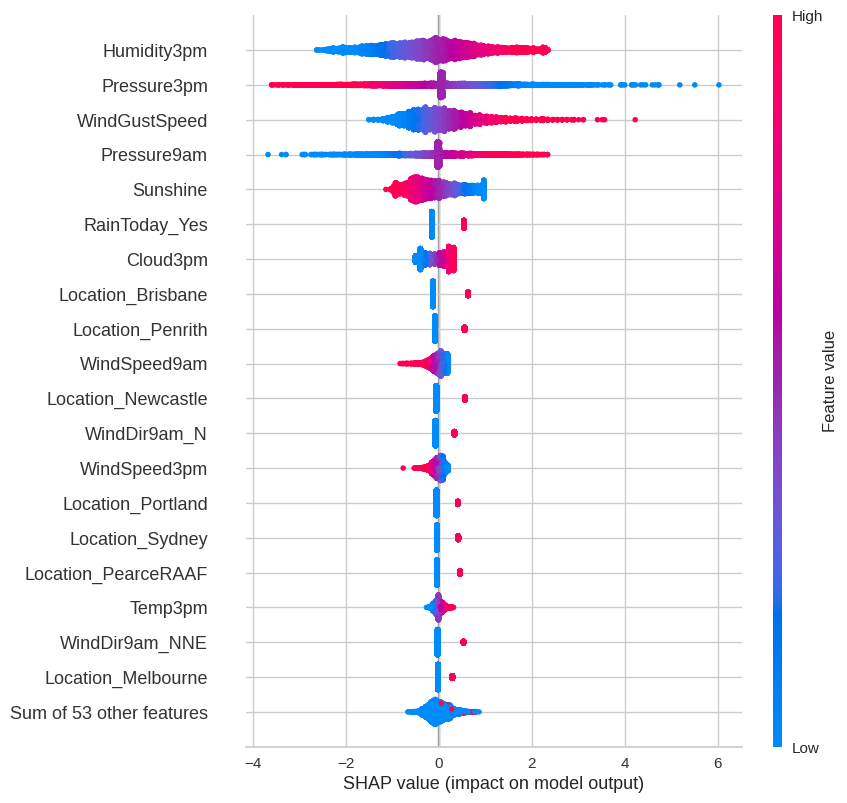

In [ ]:
shap.plots.beeswarm(global_explanation, max_display = 20)

En este grafico de enjambres de abeja podemos observar como afecta el valor de la variable en relación al SHAP value asociado. Para la mayoría de las características anteriores mencionadas, a mayor valor de la variable, mayor SHAP value, por ende, resulta en un aumento de la probabilidad de que llueva al otro día. Sunshine y Pressure3pm se mueven de forma opuesta a esto.

Cuando habiamos hecho el analisis exploratorio, mencionamos que las variables nubosidad, humedad y la cantidad de horas del sol en el día parecian tener alguna relación marcado con la variable objetivo, este analisis explicativo corrobora nuestra teoría inicial, ya que las variables con mayor SHAP value incluyen las mencionadas.

In [ ]:
# Calcula el valor SHAP promedio absoluto para cada característica y muestra las 10 variables con menor valor
mean_shap_values = np.abs(global_explanation.values).mean(axis=0)
shap_val = pd.DataFrame({
    'feature': global_explanation.feature_names,
    'mean_shap_value': mean_shap_values
})
bottom_10 = shap_val.sort_values(by='mean_shap_value').head(10)
print(bottom_10[['feature', 'mean_shap_value']])

            feature  mean_shap_value
0           MinTemp         0.000000
52   WindDir9am_SSW         0.000000
40   WindDir3pm_WNW         0.000000
39     WindDir3pm_W         0.000000
14          Temp9am         0.000000
12         Cloud9am         0.000000
71  WindGustDir_WSW         0.000000
35    WindDir3pm_SE         0.000794
69    WindGustDir_W         0.000955
70  WindGustDir_WNW         0.001412


Observamos que las variables que menos afectan al modelo son las que se relacionan con la dirección del viento. Esto puede significar que la dirección del viento no afecta demasiado a la prediccion o puede pasar tambien que al ser variables dummys para cada posible dirección, el valor de cada una sea demasiado bajo.

##AutoML


Probamos usando PyCaret

In [ ]:
#Nos habíamos guardado las variables clima_train_aml, X_test_aml y y_test_aml. Las usamos:

#Pasar a df y_test_aml para concatener con X_test_aml:
y_test_aml_df = pd.DataFrame(y_test_aml, columns=['RainTomorrow'])

#reset
X_test_aml.reset_index(drop=True, inplace=True)

#combinamos
clima_test_aml = pd.concat([X_test_aml, y_test_aml_df], axis=1)
#vemos si quedan NaN
clima_test_aml.isna().sum()

,0
Location,0
MinTemp,0
MaxTemp,0
Rainfall,0
Evaporation,0
Sunshine,0
WindGustDir,0
WindGustSpeed,0
WindDir9am,0
WindDir3pm,0


In [ ]:
clf = setup(data=clima_train_aml, target='RainTomorrow', session_id=123, test_data=clima_test_aml, index=False, n_jobs=1, fix_imbalance=True)

,Description,Value
0,Session id,123
1,Target,RainTomorrow
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(28051, 23)"
5,Transformed data shape,"(40157, 77)"
6,Transformed train set shape,"(34514, 77)"
7,Transformed test set shape,"(5643, 77)"
8,Numeric features,17
9,Categorical features,5


In [ ]:
best_model = compare_models() #mejor modelo encontrado.

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8494,0.8821,0.8494,0.8418,0.8431,0.5421,0.5477,2.4290
xgboost,Extreme Gradient Boosting,0.8486,0.8777,0.8486,0.8412,0.8425,0.5407,0.5460,4.1280
et,Extra Trees Classifier,0.8476,0.8779,0.8476,0.8396,0.8405,0.5334,0.5401,8.1570
rf,Random Forest Classifier,0.8475,0.8779,0.8475,0.8408,0.8425,0.5429,0.5466,11.4700
gbc,Gradient Boosting Classifier,0.8384,0.8702,0.8384,0.8355,0.8368,0.5345,0.5350,22.5090
ada,Ada Boost Classifier,0.8182,0.8507,0.8182,0.8243,0.8208,0.5018,0.5028,5.2790
ridge,Ridge Classifier,0.8010,0.8694,0.8010,0.8360,0.8114,0.5081,0.5223,0.8450
lda,Linear Discriminant Analysis,0.8010,0.8694,0.8010,0.8360,0.8113,0.5080,0.5222,1.2050
lr,Logistic Regression,0.7945,0.8661,0.7945,0.8340,0.8059,0.4980,0.5143,9.4170
dt,Decision Tree Classifier,0.7725,0.6948,0.7725,0.7801,0.7759,0.3775,0.3782,2.0260


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

Se ve que para estos datos un modelo de 'Light Gradient Boosting Machine' es el que mejor métricas tiene

In [ ]:
best_model

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

Vemos sus métricas f1:

In [ ]:
evaluate_model(best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
# F1 score en el modelo ajustado de manera directa
metricas_automl = pull()
metricas_automl

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8494,0.8821,0.8494,0.8418,0.8431,0.5421,0.5477,2.429
xgboost,Extreme Gradient Boosting,0.8486,0.8777,0.8486,0.8412,0.8425,0.5407,0.5460,4.128
et,Extra Trees Classifier,0.8476,0.8779,0.8476,0.8396,0.8405,0.5334,0.5401,8.157
rf,Random Forest Classifier,0.8475,0.8779,0.8475,0.8408,0.8425,0.5429,0.5466,11.470
gbc,Gradient Boosting Classifier,0.8384,0.8702,0.8384,0.8355,0.8368,0.5345,0.5350,22.509
ada,Ada Boost Classifier,0.8182,0.8507,0.8182,0.8243,0.8208,0.5018,0.5028,5.279
ridge,Ridge Classifier,0.8010,0.8694,0.8010,0.8360,0.8114,0.5081,0.5223,0.845
lda,Linear Discriminant Analysis,0.8010,0.8694,0.8010,0.8360,0.8113,0.5080,0.5222,1.205
lr,Logistic Regression,0.7945,0.8661,0.7945,0.8340,0.8059,0.4980,0.5143,9.417
dt,Decision Tree Classifier,0.7725,0.6948,0.7725,0.7801,0.7759,0.3775,0.3782,2.026


In [ ]:
f1_test_automl = metricas_automl.iloc[0,5]
print('Valor de F1 Score: ',f1_test_automl)

Valor de F1 Score:  0.8431


Se ve que logra promediar un F1 de 0.8431, muy parecida a la que obtuvimos nosotros al tunear hiperparámetros (0,85 con Optuna). Podemos constatar que no veníamos por mal camino con todas las decisiones que fuimos tomando a lo largo del TP, al ver que AutoML llega a métricas similares. Es decir, entendemos que estamos obteniendo las mejores predicciones posibles para nuestro dataset, por lo menos con las herramientas que tenemos. Incluso al estar usando LogisticRegression pudimos observar con AutoML que es de los mejores modelos para usar en este problema. Veremos en la parte 3 si con redes neuronales se puede conseguir mejorar la predicción de cuándo llueve, o si definitivamente para los datos que poseemos, estos números son los mejores que podemos obtener

#Parte Tres

##Redes Neuronales

In [ ]:
class NeuralNetwork:
    def __init__(self, epochs=50, batch_size=16, learning_rate=0.01):
        self.epochs = epochs
        self.batch_size = batch_size
        self.learning_rate = learning_rate
        self.model = None

    def build_model(self, input_shape, loss='binary_crossentropy'):
        model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(30, activation='relu', input_shape=(input_shape,)),
            tf.keras.layers.Dense(26, activation='relu'),
            tf.keras.layers.Dense(1, activation='sigmoid')  # Salida binaria
        ])
        optimizer = tf.keras.optimizers.Adam(learning_rate=self.learning_rate)
        model.compile(loss=loss, optimizer=optimizer)
        self.model = model

    def train(self, X_train, y_train, X_valid, y_valid):
        history = self.model.fit(
            X_train, y_train,
            validation_data=(X_valid, y_valid),
            epochs=self.epochs,
            batch_size=self.batch_size
        )
        return history.history

    def evaluate(self, X_test, y_test, X_train, y_train):
        y_pred = self.model.predict(X_test)
        y_pred_train = self.model.predict(X_train)
        y_pred_binary = (y_pred > 0.5).astype(int).flatten()  # Binarizar
        y_pred_train_binary = (y_pred_train > 0.5).astype(int).flatten()
        accuracy = accuracy_score(y_test, y_pred_binary)
        f1_test = f1_score(y_test, y_pred_binary, average='weighted')  # F1 ponderado
        f1_train = f1_score(y_train, y_pred_train_binary, average='weighted')
        print(f"Test F1-Score (weighted): {f1_test:.4f}, Test Accuracy: {accuracy:.4f}")
        return f1_test, f1_train, accuracy

    def predict(self, X_new):
        probabilities = self.model.predict(X_new)
        predictions = (probabilities > 0.5).astype(int).flatten()  # Binarizar
        return predictions

###Adaptación de dataframes

Tenemos que asegurarnos de usar arrays de numpy como entrada para los metodos de nuestra clase NeuralNetwork

In [ ]:
type(X_train_cv), type(y_train_cv), type(X_val_cv), type(y_val_cv), type(X_test_scaled), type(y_test)

(pandas.core.frame.DataFrame,
 pandas.core.frame.DataFrame,
 pandas.core.frame.DataFrame,
 pandas.core.frame.DataFrame,
 pandas.core.frame.DataFrame,
 numpy.ndarray)

In [ ]:
# Convertir DataFrames a NumPy arrays
X_train_nn = X_train_cv.values
y_train_nn = y_train_cv.values.flatten()  # Convertir a vector 1D

X_valid_nn = X_val_cv.values
y_valid_nn = y_val_cv.values.flatten()

X_test_nn = X_test_scaled.values
y_test_nn = y_test.flatten()


In [ ]:
type(X_train_nn), type(y_train_nn), type(X_valid_nn), type(y_valid_nn), type(X_test_nn), type(y_test_nn)

(numpy.ndarray,
 numpy.ndarray,
 numpy.ndarray,
 numpy.ndarray,
 numpy.ndarray,
 numpy.ndarray)

###Creación y entrenamiento

In [ ]:
# Crear y configurar el modelo
nn = NeuralNetwork(epochs=200, batch_size=64, learning_rate=0.05)

# Construir el modelo: input_shape debe ser el número de características en X_train_nn
nn.build_model(input_shape=X_train_nn.shape[1])

# Entrenar el modelo
history = nn.train(X_train_nn, y_train_nn, X_valid_nn, y_valid_nn)

# Evaluar el modelo en el conjunto de prueba
f1_test_nn, f1_train_nn, accuracy_score_test = nn.evaluate(X_test_nn, y_test_nn, X_train_nn, y_train_nn)

Epoch 1/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4283 - val_loss: 0.3587
Epoch 2/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3553 - val_loss: 0.3641
Epoch 3/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3519 - val_loss: 0.3466
Epoch 4/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3574 - val_loss: 0.3543
Epoch 5/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3429 - val_loss: 0.3688
Epoch 6/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3499 - val_loss: 0.3559
Epoch 7/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3343 - val_loss: 0.3631
Epoch 8/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3431 - val_loss: 0.3579
Epoch 9/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3184 - val_loss: 0.3639
Epoch 10/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3202 - val_loss: 0.3516
Epoch 11/200
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3357 - val_loss: 0.3650
Epoch 12/200
281/281 ━━━━━━━━━━━━━━━━━━━━

In [ ]:
f1_test_nn, f1_train_nn

(0.8208932071031293, 0.8932332008574151)

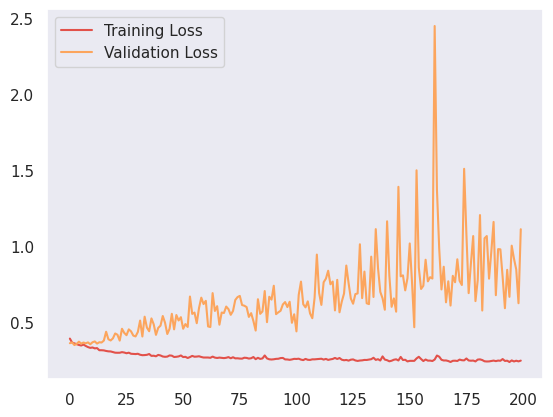

In [ ]:
plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

Métricas que nos devuelve el modelo:  
F1 Score (Balanceado) = 0.8209  
Si comparamos esto con los anteriores modelos vemos que seguimos estancados en métricas similares. En el modelo de regresión lineal habíamos obtenido 81%
También observamos en la gráfica de training loss y validation loss que a medida que pasan las epocas Validation Loss aumenta a la vez que presenta muchísimo ruido. Esto puede significar varias cosas: que estamos teniendo un problema de sobreajuste y nos ha faltado regularización o drop out, o que hicimos un modelo neuronal muy complejo (quizás una capa menos funcione bien). Con respecto al sobreajuste, de hecho f1 en train nos quedó levemente mayor (89%) que en test (82%)

###Optimización de Hiperparámetros

Vamos a volver a implementar Optuna, pero agregamos a la clase de NeuralNetwork hiperparámetros relacionados a DropOut y regularización l2 para ver si podemos resolver el problema del ruido que obtuvimos. También sumamos capas y neuronas para encontrar la combinación óptima del conjunto

In [ ]:
#Optuna
def objective(trial):
    epochs = trial.suggest_int('epochs', 10, 150)
    batch_size = trial.suggest_categorical('batch_size', [16, 32, 64, 128])
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.6)
    units = trial.suggest_int('units_per_layer', 16, 128)
    num_hidden_layers = trial.suggest_int('num_hidden_layers', 1, 3)
    optimizer_name = trial.suggest_categorical('optimizer', ['adam', 'sgd'])

    #Valor fijo para la regularización L2
    l2_lambda = 0.002

    #Crear y configurar el modelo
    nn = NeuralNetwork(epochs=epochs, batch_size=batch_size, learning_rate=learning_rate)
    nn.model = tf.keras.models.Sequential()
    nn.model.add(tf.keras.layers.InputLayer(input_shape=(X_train_nn.shape[1],)))

    #Añadir capas ocultas dinámicamente con regularización L2
    for _ in range(num_hidden_layers):
        nn.model.add(tf.keras.layers.Dense(
            units,
            activation='relu',
            kernel_regularizer=tf.keras.regularizers.L2(l2_lambda)  #Regularización L2 fija
        ))
        nn.model.add(tf.keras.layers.Dropout(dropout_rate))

    #Capa de salida
    nn.model.add(tf.keras.layers.Dense(
        1,
        activation='sigmoid',
        kernel_regularizer=tf.keras.regularizers.L2(l2_lambda)  #Regularización L2 fija en salida
    ))

    #Configurar optimizador
    if optimizer_name == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_name == 'sgd':
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)

    nn.model.compile(optimizer=optimizer, loss='binary_crossentropy')

    #Entrenar modelo
    history = nn.train(X_train_nn, y_train_nn, X_valid_nn, y_valid_nn)

    #F1-score
    y_pred_binary = (nn.predict(X_valid_nn) > 0.5).astype(int)
    f1 = f1_score(y_valid_nn, y_pred_binary, average='weighted')
    return f1

#Estudio de Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=30)

#Resultados
print("Best hyperparameters:", study.best_params)

[I 2024-12-14 00:53:37,538] A new study created in memory with name: no-name-548eecd7-06e6-4085-9439-5babefae7666


Epoch 1/150
281/281 ━━━━━━━━━━━━━━━━━━━━ 9s 13ms/step - loss: 1.4340 - val_loss: 1.2218
Epoch 2/150
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3046 - val_loss: 1.1584
Epoch 3/150
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2501 - val_loss: 1.1004
Epoch 4/150
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2054 - val_loss: 1.0553
Epoch 5/150
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1524 - val_loss: 1.0186
Epoch 6/150
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1239 - val_loss: 0.9888
Epoch 7/150
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0815 - val_loss: 0.9680
Epoch 8/150
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0665 - val_loss: 0.9504
Epoch 9/150
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0441 - val_loss: 0.9351
Epoch 10/150
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0013 - val_loss: 0.9206
Epoch 11/150
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9981 - val_loss: 0.9074
Epoch 12/150
281/281 ━━━━━━━━━━━━━━━━━━━

[I 2024-12-14 00:55:41,550] Trial 0 finished with value: 0.8406522190237669 and parameters: {'epochs': 150, 'batch_size': 64, 'learning_rate': 3.1692430834263475e-05, 'dropout_rate': 0.5717528943003951, 'units_per_layer': 106, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 0 with value: 0.8406522190237669.


Epoch 1/140
141/141 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.9661 - val_loss: 0.8166
Epoch 2/140
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8121 - val_loss: 0.7100
Epoch 3/140
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7109 - val_loss: 0.6477
Epoch 4/140
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6544 - val_loss: 0.6104
Epoch 5/140
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6235 - val_loss: 0.5840
Epoch 6/140
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5915 - val_loss: 0.5640
Epoch 7/140
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5762 - val_loss: 0.5468
Epoch 8/140
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5540 - val_loss: 0.5311
Epoch 9/140
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5392 - val_loss: 0.5200
Epoch 10/140
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5280 - val_loss: 0.5088
Epoch 11/140
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5232 - val_loss: 0.5003
Epoch 12/140
141/141 ━━━━━━━━━━━━━━━━━━━

[I 2024-12-14 00:56:42,064] Trial 1 finished with value: 0.8497090882253093 and parameters: {'epochs': 140, 'batch_size': 128, 'learning_rate': 0.00010820485082435808, 'dropout_rate': 0.15381098131112478, 'units_per_layer': 51, 'num_hidden_layers': 2, 'optimizer': 'adam'}. Best is trial 1 with value: 0.8497090882253093.


Epoch 1/93
281/281 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.8579 - val_loss: 0.7058
Epoch 2/93
281/281 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.7263 - val_loss: 0.6372
Epoch 3/93
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6613 - val_loss: 0.6096
Epoch 4/93
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6235 - val_loss: 0.5835
Epoch 5/93
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6118 - val_loss: 0.5719
Epoch 6/93
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5961 - val_loss: 0.5615
Epoch 7/93
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5806 - val_loss: 0.5544
Epoch 8/93
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5659 - val_loss: 0.5512
Epoch 9/93
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5639 - val_loss: 0.5501
Epoch 10/93
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5606 - val_loss: 0.5396
Epoch 11/93
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5436 - val_loss: 0.5359
Epoch 12/93
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

[I 2024-12-14 00:57:49,051] Trial 2 finished with value: 0.8368785845900397 and parameters: {'epochs': 93, 'batch_size': 64, 'learning_rate': 0.0024675506539607477, 'dropout_rate': 0.2618602009376022, 'units_per_layer': 68, 'num_hidden_layers': 1, 'optimizer': 'sgd'}. Best is trial 1 with value: 0.8497090882253093.


Epoch 1/147
141/141 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.9002 - val_loss: 0.8618
Epoch 2/147
141/141 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.8957 - val_loss: 0.8579
Epoch 3/147
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8958 - val_loss: 0.8540
Epoch 4/147
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8824 - val_loss: 0.8501
Epoch 5/147
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8814 - val_loss: 0.8463
Epoch 6/147
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8823 - val_loss: 0.8427
Epoch 7/147
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8696 - val_loss: 0.8393
Epoch 8/147
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8708 - val_loss: 0.8359
Epoch 9/147
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8712 - val_loss: 0.8325
Epoch 10/147
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8593 - val_loss: 0.8294
Epoch 11/147
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8671 - val_loss: 0.8263
Epoch 12/147
141/141 ━━━━━━━━━━━━━━━━━━━

[I 2024-12-14 00:58:41,930] Trial 3 finished with value: 0.7875712283429843 and parameters: {'epochs': 147, 'batch_size': 128, 'learning_rate': 6.104907088882693e-05, 'dropout_rate': 0.2769269640071632, 'units_per_layer': 74, 'num_hidden_layers': 1, 'optimizer': 'sgd'}. Best is trial 1 with value: 0.8497090882253093.


Epoch 1/121
141/141 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 1.5436 - val_loss: 1.3661
Epoch 2/121
141/141 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1.4179 - val_loss: 1.3093
Epoch 3/121
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3580 - val_loss: 1.2707
Epoch 4/121
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3191 - val_loss: 1.2355
Epoch 5/121
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2809 - val_loss: 1.2018
Epoch 6/121
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2425 - val_loss: 1.1702
Epoch 7/121
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2213 - val_loss: 1.1420
Epoch 8/121
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1959 - val_loss: 1.1168
Epoch 9/121
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1662 - val_loss: 1.0951
Epoch 10/121
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1473 - val_loss: 1.0760
Epoch 11/121
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.1344 - val_loss: 1.0610
Epoch 12/121
141/141 ━━━━━━━━━━━━━━━━━━━

[I 2024-12-14 00:59:53,786] Trial 4 finished with value: 0.8352967484176416 and parameters: {'epochs': 121, 'batch_size': 128, 'learning_rate': 1.4399644773552943e-05, 'dropout_rate': 0.3733280937080379, 'units_per_layer': 119, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 1 with value: 0.8497090882253093.


Epoch 1/133
561/561 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 1.3682 - val_loss: 1.2292
Epoch 2/133
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2487 - val_loss: 1.1754
Epoch 3/133
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1967 - val_loss: 1.1479
Epoch 4/133
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1543 - val_loss: 1.1272
Epoch 5/133
561/561 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.1334 - val_loss: 1.1100
Epoch 6/133
561/561 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.1272 - val_loss: 1.0950
Epoch 7/133
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1138 - val_loss: 1.0839
Epoch 8/133
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1062 - val_loss: 1.0706
Epoch 9/133
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1000 - val_loss: 1.0621
Epoch 10/133
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0766 - val_loss: 1.0534
Epoch 11/133
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0768 - val_loss: 1.0445
Epoch 12/133
561/561 ━━━━━━━━━━━━━━━━━━━━

[I 2024-12-14 01:02:56,487] Trial 5 finished with value: 0.8406662210444398 and parameters: {'epochs': 133, 'batch_size': 32, 'learning_rate': 0.0013710285284468952, 'dropout_rate': 0.33901656185249673, 'units_per_layer': 123, 'num_hidden_layers': 3, 'optimizer': 'sgd'}. Best is trial 1 with value: 0.8497090882253093.


Epoch 1/109
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - loss: 1.1884 - val_loss: 1.0330
Epoch 2/109
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 1.0402 - val_loss: 0.9737
Epoch 3/109
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.9742 - val_loss: 0.9302
Epoch 4/109
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.9350 - val_loss: 0.8943
Epoch 5/109
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.9035 - val_loss: 0.8603
Epoch 6/109
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.8606 - val_loss: 0.8280
Epoch 7/109
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.8343 - val_loss: 0.8011
Epoch 8/109
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.8052 - val_loss: 0.7769
Epoch 9/109
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.7752 - val_loss: 0.7539
Epoch 10/109
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.7573 - val_loss: 0.7285
Epoch 11/109
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.7322 - val_loss: 0.7081
Epoch 12/109
1121/1

[I 2024-12-14 01:08:03,989] Trial 6 finished with value: 0.8437272018363637 and parameters: {'epochs': 109, 'batch_size': 16, 'learning_rate': 0.006688078852508047, 'dropout_rate': 0.2644917090516117, 'units_per_layer': 118, 'num_hidden_layers': 3, 'optimizer': 'sgd'}. Best is trial 1 with value: 0.8497090882253093.


Epoch 1/107
281/281 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.5866 - val_loss: 0.4136
Epoch 2/107
281/281 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.4128 - val_loss: 0.4067
Epoch 3/107
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4128 - val_loss: 0.4013
Epoch 4/107
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4098 - val_loss: 0.3960
Epoch 5/107
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4088 - val_loss: 0.4074
Epoch 6/107
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4130 - val_loss: 0.4033
Epoch 7/107
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4050 - val_loss: 0.3927
Epoch 8/107
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4003 - val_loss: 0.3968
Epoch 9/107
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4096 - val_loss: 0.3922
Epoch 10/107
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4037 - val_loss: 0.3907
Epoch 11/107
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4035 - val_loss: 0.3901
Epoch 12/107
281/281 ━━━━━━━━━━━━━━━━━━━

[I 2024-12-14 01:09:24,557] Trial 7 finished with value: 0.8310202989060642 and parameters: {'epochs': 107, 'batch_size': 64, 'learning_rate': 0.007087975313684776, 'dropout_rate': 0.27290708195270386, 'units_per_layer': 106, 'num_hidden_layers': 2, 'optimizer': 'adam'}. Best is trial 1 with value: 0.8497090882253093.


Epoch 1/67
141/141 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 1.0358 - val_loss: 0.9038
Epoch 2/67
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9178 - val_loss: 0.8223
Epoch 3/67
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8371 - val_loss: 0.7757
Epoch 4/67
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7953 - val_loss: 0.7439
Epoch 5/67
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7637 - val_loss: 0.7220
Epoch 6/67
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7420 - val_loss: 0.7048
Epoch 7/67
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7115 - val_loss: 0.6880
Epoch 8/67
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7064 - val_loss: 0.6743
Epoch 9/67
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6874 - val_loss: 0.6583
Epoch 10/67
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6798 - val_loss: 0.6471
Epoch 11/67
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6702 - val_loss: 0.6353
Epoch 12/67
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/ste

[I 2024-12-14 01:10:04,394] Trial 8 finished with value: 0.8397478432995528 and parameters: {'epochs': 67, 'batch_size': 128, 'learning_rate': 4.940391477642804e-05, 'dropout_rate': 0.22183545597996893, 'units_per_layer': 95, 'num_hidden_layers': 2, 'optimizer': 'adam'}. Best is trial 1 with value: 0.8497090882253093.


Epoch 1/90
141/141 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.7137 - val_loss: 0.4623
Epoch 2/90
141/141 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.4575 - val_loss: 0.4135
Epoch 3/90
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4253 - val_loss: 0.4066
Epoch 4/90
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4093 - val_loss: 0.3865
Epoch 5/90
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3862 - val_loss: 0.3930
Epoch 6/90
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3949 - val_loss: 0.3803
Epoch 7/90
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3924 - val_loss: 0.3777
Epoch 8/90
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3858 - val_loss: 0.3775
Epoch 9/90
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3858 - val_loss: 0.3765
Epoch 10/90
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3824 - val_loss: 0.3743
Epoch 11/90
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3789 - val_loss: 0.3795
Epoch 12/90
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/ste

[I 2024-12-14 01:10:59,938] Trial 9 finished with value: 0.8416519308763977 and parameters: {'epochs': 90, 'batch_size': 128, 'learning_rate': 0.002496133074626915, 'dropout_rate': 0.18719582221234385, 'units_per_layer': 46, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 1 with value: 0.8497090882253093.


Epoch 1/20
561/561 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 0.8099 - val_loss: 0.5556
Epoch 2/20
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6098 - val_loss: 0.4995
Epoch 3/20
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5450 - val_loss: 0.4729
Epoch 4/20
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5071 - val_loss: 0.4548
Epoch 5/20
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4821 - val_loss: 0.4399
Epoch 6/20
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4694 - val_loss: 0.4301
Epoch 7/20
561/561 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.4572 - val_loss: 0.4220
Epoch 8/20
561/561 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4410 - val_loss: 0.4146
Epoch 9/20
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4379 - val_loss: 0.4087
Epoch 10/20
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4287 - val_loss: 0.4046
Epoch 11/20
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4171 - val_loss: 0.3995
Epoch 12/20
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

[I 2024-12-14 01:11:32,649] Trial 10 finished with value: 0.8402594145458898 and parameters: {'epochs': 20, 'batch_size': 32, 'learning_rate': 0.00023969013085849795, 'dropout_rate': 0.4721823763545889, 'units_per_layer': 26, 'num_hidden_layers': 2, 'optimizer': 'adam'}. Best is trial 1 with value: 0.8497090882253093.


Epoch 1/65
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - loss: 0.9356 - val_loss: 0.8210
Epoch 2/65
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 0.8368 - val_loss: 0.7759
Epoch 3/65
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.7938 - val_loss: 0.7448
Epoch 4/65
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.7638 - val_loss: 0.7231
Epoch 5/65
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.7460 - val_loss: 0.7074
Epoch 6/65
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.7307 - val_loss: 0.6967
Epoch 7/65
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.7192 - val_loss: 0.6867
Epoch 8/65
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.7087 - val_loss: 0.6794
Epoch 9/65
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.6999 - val_loss: 0.6733
Epoch 10/65
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.6977 - val_loss: 0.6688
Epoch 11/65
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6844 - val_loss: 0.6631
Epoch 12/65
1121/1121 ━━━━━━━━

[I 2024-12-14 01:14:45,259] Trial 11 finished with value: 0.8237583638901139 and parameters: {'epochs': 65, 'batch_size': 16, 'learning_rate': 0.00023584459869344684, 'dropout_rate': 0.13538496532272598, 'units_per_layer': 54, 'num_hidden_layers': 2, 'optimizer': 'sgd'}. Best is trial 1 with value: 0.8497090882253093.


Epoch 1/118
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 0.8112 - val_loss: 0.6353
Epoch 2/118
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6343 - val_loss: 0.5714
Epoch 3/118
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.5773 - val_loss: 0.5373
Epoch 4/118
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5424 - val_loss: 0.5188
Epoch 5/118
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5251 - val_loss: 0.5038
Epoch 6/118
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5140 - val_loss: 0.4950
Epoch 7/118
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.5011 - val_loss: 0.4873
Epoch 8/118
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4940 - val_loss: 0.4818
Epoch 9/118
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4865 - val_loss: 0.4794
Epoch 10/118
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4869 - val_loss: 0.4750
Epoch 11/118
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4726 - val_loss: 0.4717
Epoch 12/118
1121/1

[I 2024-12-14 01:20:03,484] Trial 12 finished with value: 0.8388588891039683 and parameters: {'epochs': 118, 'batch_size': 16, 'learning_rate': 0.0007325829607324354, 'dropout_rate': 0.11308419877255249, 'units_per_layer': 28, 'num_hidden_layers': 1, 'optimizer': 'sgd'}. Best is trial 1 with value: 0.8497090882253093.


Epoch 1/30
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - loss: 0.8541 - val_loss: 0.7096
Epoch 2/30
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.7150 - val_loss: 0.6630
Epoch 3/30
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6691 - val_loss: 0.6363
Epoch 4/30
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.6406 - val_loss: 0.6097
Epoch 5/30
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6293 - val_loss: 0.5878
Epoch 6/30
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6067 - val_loss: 0.5751
Epoch 7/30
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.5725 - val_loss: 0.5505
Epoch 8/30
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.5537 - val_loss: 0.5343
Epoch 9/30
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5428 - val_loss: 0.5207
Epoch 10/30
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.5304 - val_loss: 0.5090
Epoch 11/30
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.5191 - val_loss: 0.5004
Epoch 12/30
1121/1121 ━━━━━━━━

[I 2024-12-14 01:21:27,309] Trial 13 finished with value: 0.8397914247981183 and parameters: {'epochs': 30, 'batch_size': 16, 'learning_rate': 0.009593397708914318, 'dropout_rate': 0.3747276679022403, 'units_per_layer': 85, 'num_hidden_layers': 2, 'optimizer': 'sgd'}. Best is trial 1 with value: 0.8497090882253093.


Epoch 1/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - loss: 0.8564 - val_loss: 0.6457
Epoch 2/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6436 - val_loss: 0.5748
Epoch 3/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.5752 - val_loss: 0.5356
Epoch 4/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.5371 - val_loss: 0.5075
Epoch 5/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5182 - val_loss: 0.4889
Epoch 6/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4893 - val_loss: 0.4724
Epoch 7/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.4802 - val_loss: 0.4572
Epoch 8/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4700 - val_loss: 0.4459
Epoch 9/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.4542 - val_loss: 0.4367
Epoch 10/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4433 - val_loss: 0.4297
Epoch 11/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4325 - val_loss: 0.4238
Epoch 12/130
1121/

[I 2024-12-14 01:28:17,856] Trial 14 finished with value: 0.851814940271651 and parameters: {'epochs': 130, 'batch_size': 16, 'learning_rate': 0.00010288696913081342, 'dropout_rate': 0.16933714418516962, 'units_per_layer': 47, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/132
141/141 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.9764 - val_loss: 0.7198
Epoch 2/132
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7284 - val_loss: 0.6279
Epoch 3/132
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6553 - val_loss: 0.5964
Epoch 4/132
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6225 - val_loss: 0.5770
Epoch 5/132
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5999 - val_loss: 0.5580
Epoch 6/132
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5795 - val_loss: 0.5456
Epoch 7/132
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5694 - val_loss: 0.5331
Epoch 8/132
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5509 - val_loss: 0.5230
Epoch 9/132
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5489 - val_loss: 0.5144
Epoch 10/132
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5289 - val_loss: 0.5063
Epoch 11/132
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5209 - val_loss: 0.4964
Epoch 12/132
141/141 ━━━━━━━━━━━━━━━━━━━

[I 2024-12-14 01:29:27,110] Trial 15 finished with value: 0.8483485639934936 and parameters: {'epochs': 132, 'batch_size': 128, 'learning_rate': 0.000106956365539097, 'dropout_rate': 0.1660553965805197, 'units_per_layer': 45, 'num_hidden_layers': 2, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/49
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - loss: 0.8686 - val_loss: 0.6565
Epoch 2/49
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.6476 - val_loss: 0.5807
Epoch 3/49
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.5824 - val_loss: 0.5392
Epoch 4/49
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5357 - val_loss: 0.5079
Epoch 5/49
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5115 - val_loss: 0.4861
Epoch 6/49
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.4973 - val_loss: 0.4706
Epoch 7/49
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4810 - val_loss: 0.4574
Epoch 8/49
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4623 - val_loss: 0.4451
Epoch 9/49
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4468 - val_loss: 0.4351
Epoch 10/49
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4249 - val_loss: 0.4274
Epoch 11/49
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4330 - val_loss: 0.4210
Epoch 12/49
1121/1121 ━━━━━━━━

[I 2024-12-14 01:31:51,830] Trial 16 finished with value: 0.8513277975899649 and parameters: {'epochs': 49, 'batch_size': 16, 'learning_rate': 0.00011173173091053863, 'dropout_rate': 0.11669515899039168, 'units_per_layer': 56, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - loss: 0.7654 - val_loss: 0.5413
Epoch 2/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5163 - val_loss: 0.4639
Epoch 3/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.4506 - val_loss: 0.4285
Epoch 4/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4301 - val_loss: 0.4097
Epoch 5/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4135 - val_loss: 0.3964
Epoch 6/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4002 - val_loss: 0.3876
Epoch 7/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.3908 - val_loss: 0.3833
Epoch 8/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.3969 - val_loss: 0.3818
Epoch 9/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.3729 - val_loss: 0.3784
Epoch 10/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.3781 - val_loss: 0.3828
Epoch 11/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3775 - val_loss: 0.3728
Epoch 12/42
1121/1121 ━━━━━━━━

[I 2024-12-14 01:34:06,199] Trial 17 finished with value: 0.8498072914051213 and parameters: {'epochs': 42, 'batch_size': 16, 'learning_rate': 0.00040905664528653496, 'dropout_rate': 0.10612943666975441, 'units_per_layer': 62, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - loss: 0.9663 - val_loss: 0.8710
Epoch 2/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.8850 - val_loss: 0.8115
Epoch 3/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.8347 - val_loss: 0.7620
Epoch 4/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.7904 - val_loss: 0.7245
Epoch 5/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.7489 - val_loss: 0.6965
Epoch 6/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.7155 - val_loss: 0.6754
Epoch 7/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6983 - val_loss: 0.6622
Epoch 8/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6780 - val_loss: 0.6501
Epoch 9/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.6675 - val_loss: 0.6397
Epoch 10/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.6682 - val_loss: 0.6309
Epoch 11/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.6627 - val_loss: 0.6232
Epoch 12/53
1121/1121 ━━━━━━━━

[I 2024-12-14 01:37:11,747] Trial 18 finished with value: 0.8325935803540285 and parameters: {'epochs': 53, 'batch_size': 16, 'learning_rate': 1.2776799094660672e-05, 'dropout_rate': 0.20084968833469963, 'units_per_layer': 38, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/76
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.8523 - val_loss: 0.6424
Epoch 2/76
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.6815 - val_loss: 0.5539
Epoch 3/76
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6129 - val_loss: 0.5194
Epoch 4/76
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5620 - val_loss: 0.4977
Epoch 5/76
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.5364 - val_loss: 0.4829
Epoch 6/76
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.5333 - val_loss: 0.4702
Epoch 7/76
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.5101 - val_loss: 0.4600
Epoch 8/76
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4976 - val_loss: 0.4503
Epoch 9/76
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4874 - val_loss: 0.4408
Epoch 10/76
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.4769 - val_loss: 0.4351
Epoch 11/76
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4683 - val_loss: 0.4268
Epoch 12/76
1121/1121 ━━━━━━━

[I 2024-12-14 01:41:03,504] Trial 19 finished with value: 0.8452859052059193 and parameters: {'epochs': 76, 'batch_size': 16, 'learning_rate': 0.0001354242769162235, 'dropout_rate': 0.44044632665397965, 'units_per_layer': 17, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/43
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - loss: 1.0998 - val_loss: 0.9154
Epoch 2/43
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.9253 - val_loss: 0.8464
Epoch 3/43
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.8600 - val_loss: 0.8001
Epoch 4/43
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.8038 - val_loss: 0.7687
Epoch 5/43
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.7729 - val_loss: 0.7352
Epoch 6/43
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.7479 - val_loss: 0.7081
Epoch 7/43
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.7183 - val_loss: 0.6854
Epoch 8/43
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6933 - val_loss: 0.6656
Epoch 9/43
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.6766 - val_loss: 0.6474
Epoch 10/43
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6500 - val_loss: 0.6295
Epoch 11/43
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6324 - val_loss: 0.6140
Epoch 12/43
1121/1121 ━━━━━━━

[I 2024-12-14 01:43:22,979] Trial 20 finished with value: 0.8428238853002158 and parameters: {'epochs': 43, 'batch_size': 16, 'learning_rate': 2.8783981053332514e-05, 'dropout_rate': 0.2269877722929591, 'units_per_layer': 83, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/12
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - loss: 0.7569 - val_loss: 0.5360
Epoch 2/12
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.5160 - val_loss: 0.4667
Epoch 3/12
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4660 - val_loss: 0.4315
Epoch 4/12
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4284 - val_loss: 0.4091
Epoch 5/12
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.4121 - val_loss: 0.3982
Epoch 6/12
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4044 - val_loss: 0.3979
Epoch 7/12
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3889 - val_loss: 0.3878
Epoch 8/12
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3816 - val_loss: 0.3804
Epoch 9/12
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.3844 - val_loss: 0.3744
Epoch 10/12
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.3776 - val_loss: 0.3755
Epoch 11/12
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.3765 - val_loss: 0.3732
Epoch 12/12
1121/1121 ━━━━━━━━

[I 2024-12-14 01:44:05,941] Trial 21 finished with value: 0.8441290375754956 and parameters: {'epochs': 12, 'batch_size': 16, 'learning_rate': 0.0004480916455623416, 'dropout_rate': 0.11084502207281446, 'units_per_layer': 62, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.7247 - val_loss: 0.5062
Epoch 2/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.4858 - val_loss: 0.4428
Epoch 3/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4406 - val_loss: 0.4153
Epoch 4/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4108 - val_loss: 0.4013
Epoch 5/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.3927 - val_loss: 0.3976
Epoch 6/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.3924 - val_loss: 0.3813
Epoch 7/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.3813 - val_loss: 0.3758
Epoch 8/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.3803 - val_loss: 0.3823
Epoch 9/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.3822 - val_loss: 0.3724
Epoch 10/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.3768 - val_loss: 0.3707
Epoch 11/42
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3717 - val_loss: 0.3704
Epoch 12/42
1121/1121 ━━━━━━━

[I 2024-12-14 01:46:20,418] Trial 22 finished with value: 0.8465289333781788 and parameters: {'epochs': 42, 'batch_size': 16, 'learning_rate': 0.0006636281090862307, 'dropout_rate': 0.1038196894628072, 'units_per_layer': 61, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - loss: 0.7888 - val_loss: 0.5897
Epoch 2/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.5864 - val_loss: 0.5304
Epoch 3/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.5319 - val_loss: 0.4956
Epoch 4/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.5037 - val_loss: 0.4756
Epoch 5/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.4771 - val_loss: 0.4558
Epoch 6/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4602 - val_loss: 0.4445
Epoch 7/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4432 - val_loss: 0.4342
Epoch 8/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4340 - val_loss: 0.4258
Epoch 9/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.4277 - val_loss: 0.4156
Epoch 10/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4186 - val_loss: 0.4086
Epoch 11/53
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4214 - val_loss: 0.4053
Epoch 12/53
1121/1121 ━━━━━━━

[I 2024-12-14 01:49:08,585] Trial 23 finished with value: 0.8490489001968979 and parameters: {'epochs': 53, 'batch_size': 16, 'learning_rate': 0.0001681262083072521, 'dropout_rate': 0.16392392953402476, 'units_per_layer': 37, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/32
561/561 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - loss: 0.8969 - val_loss: 0.6353
Epoch 2/32
561/561 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.6123 - val_loss: 0.5368
Epoch 3/32
561/561 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5387 - val_loss: 0.4874
Epoch 4/32
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4804 - val_loss: 0.4579
Epoch 5/32
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4567 - val_loss: 0.4362
Epoch 6/32
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4371 - val_loss: 0.4252
Epoch 7/32
561/561 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4155 - val_loss: 0.4099
Epoch 8/32
561/561 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4168 - val_loss: 0.4065
Epoch 9/32
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4050 - val_loss: 0.3962
Epoch 10/32
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3972 - val_loss: 0.3902
Epoch 11/32
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3942 - val_loss: 0.3846
Epoch 12/32
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/ste

[I 2024-12-14 01:50:07,597] Trial 24 finished with value: 0.8477221058987784 and parameters: {'epochs': 32, 'batch_size': 32, 'learning_rate': 0.0003503865592639945, 'dropout_rate': 0.14077686044780088, 'units_per_layer': 75, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/59
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - loss: 0.9737 - val_loss: 0.7722
Epoch 2/59
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.7905 - val_loss: 0.6918
Epoch 3/59
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.7155 - val_loss: 0.6453
Epoch 4/59
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6655 - val_loss: 0.6120
Epoch 5/59
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.6280 - val_loss: 0.5831
Epoch 6/59
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5950 - val_loss: 0.5607
Epoch 7/59
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.5766 - val_loss: 0.5412
Epoch 8/59
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.5550 - val_loss: 0.5256
Epoch 9/59
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5447 - val_loss: 0.5103
Epoch 10/59
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.5276 - val_loss: 0.4972
Epoch 11/59
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5093 - val_loss: 0.4866
Epoch 12/59
1121/1121 ━━━━━━━━

[I 2024-12-14 01:53:16,557] Trial 25 finished with value: 0.8458693257033301 and parameters: {'epochs': 59, 'batch_size': 16, 'learning_rate': 6.118831524495827e-05, 'dropout_rate': 0.31670385195428075, 'units_per_layer': 59, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/81
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.6896 - val_loss: 0.5024
Epoch 2/81
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4914 - val_loss: 0.4467
Epoch 3/81
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4436 - val_loss: 0.4167
Epoch 4/81
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.4176 - val_loss: 0.4003
Epoch 5/81
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.3993 - val_loss: 0.3934
Epoch 6/81
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.3934 - val_loss: 0.3846
Epoch 7/81
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3928 - val_loss: 0.3798
Epoch 8/81
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.3919 - val_loss: 0.3786
Epoch 9/81
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.3845 - val_loss: 0.3757
Epoch 10/81
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.3772 - val_loss: 0.3768
Epoch 11/81
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3789 - val_loss: 0.3779
Epoch 12/81
1121/1121 ━━━━━━━

[I 2024-12-14 01:57:55,920] Trial 26 finished with value: 0.8474391683618627 and parameters: {'epochs': 81, 'batch_size': 16, 'learning_rate': 0.0004896850400837816, 'dropout_rate': 0.2028447997542906, 'units_per_layer': 36, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/40
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - loss: 0.8873 - val_loss: 0.6307
Epoch 2/40
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 0.6371 - val_loss: 0.5696
Epoch 3/40
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.5716 - val_loss: 0.5314
Epoch 4/40
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5289 - val_loss: 0.5059
Epoch 5/40
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5129 - val_loss: 0.4836
Epoch 6/40
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4891 - val_loss: 0.4688
Epoch 7/40
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4738 - val_loss: 0.4565
Epoch 8/40
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4456 - val_loss: 0.4461
Epoch 9/40
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.4479 - val_loss: 0.4380
Epoch 10/40
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4384 - val_loss: 0.4346
Epoch 11/40
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4323 - val_loss: 0.4258
Epoch 12/40
1121/1121 ━━━━━━━━

[I 2024-12-14 02:00:14,790] Trial 27 finished with value: 0.8482315812997225 and parameters: {'epochs': 40, 'batch_size': 16, 'learning_rate': 8.924425219870051e-05, 'dropout_rate': 0.13757010313996626, 'units_per_layer': 67, 'num_hidden_layers': 2, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/25
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.9325 - val_loss: 0.6660
Epoch 2/25
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.6570 - val_loss: 0.5659
Epoch 3/25
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.5574 - val_loss: 0.5105
Epoch 4/25
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.5128 - val_loss: 0.4704
Epoch 5/25
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4691 - val_loss: 0.4495
Epoch 6/25
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.4468 - val_loss: 0.4292
Epoch 7/25
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4323 - val_loss: 0.4154
Epoch 8/25
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4120 - val_loss: 0.4065
Epoch 9/25
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4027 - val_loss: 0.3989
Epoch 10/25
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.4026 - val_loss: 0.3916
Epoch 11/25
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3951 - val_loss: 0.3857
Epoch 12/25
1121/1121 ━━━━━━━

[I 2024-12-14 02:01:37,432] Trial 28 finished with value: 0.8470900797124615 and parameters: {'epochs': 25, 'batch_size': 16, 'learning_rate': 0.00022455782408802402, 'dropout_rate': 0.23305822390163067, 'units_per_layer': 82, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Epoch 1/14
281/281 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - loss: 1.1499 - val_loss: 0.9405
Epoch 2/14
281/281 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 1.1074 - val_loss: 0.9086
Epoch 3/14
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0452 - val_loss: 0.8836
Epoch 4/14
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0159 - val_loss: 0.8608
Epoch 5/14
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9896 - val_loss: 0.8416
Epoch 6/14
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9600 - val_loss: 0.8247
Epoch 7/14
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9431 - val_loss: 0.8063
Epoch 8/14
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.9075 - val_loss: 0.7902
Epoch 9/14
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.8904 - val_loss: 0.7749
Epoch 10/14
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8738 - val_loss: 0.7613
Epoch 11/14
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8646 - val_loss: 0.7473
Epoch 12/14
281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/ste

[I 2024-12-14 02:02:01,167] Trial 29 finished with value: 0.7523277727618193 and parameters: {'epochs': 14, 'batch_size': 64, 'learning_rate': 3.493735686506957e-05, 'dropout_rate': 0.5302318628908287, 'units_per_layer': 47, 'num_hidden_layers': 3, 'optimizer': 'adam'}. Best is trial 14 with value: 0.851814940271651.


Best hyperparameters: {'epochs': 130, 'batch_size': 16, 'learning_rate': 0.00010288696913081342, 'dropout_rate': 0.16933714418516962, 'units_per_layer': 47, 'num_hidden_layers': 3, 'optimizer': 'adam'}


De nuestro estudio hecho con optuna encontramos que la mejor métrica fue 0.8518 para el F1-Score en los datos de validación. Ahora probaremos en los de test

In [ ]:
best_nn_params = study.best_params
best_nn_params

{'epochs': 130,
 'batch_size': 16,
 'learning_rate': 0.00010288696913081342,
 'dropout_rate': 0.16933714418516962,
 'units_per_layer': 47,
 'num_hidden_layers': 3,
 'optimizer': 'adam'}

In [ ]:
best_nn_params = {'epochs': 130,
 'batch_size': 16,
 'learning_rate': 0.00010288696913081342,
 'dropout_rate': 0.16933714418516962,
 'units_per_layer': 47,
 'num_hidden_layers': 3,
 'optimizer': 'adam'} #guardamos para otras sesiones de ejecución

Vemos métrica f1 segun estos parámetros optimizados. Creamos el modelo con ellos:

In [ ]:
# Extraer valores óptimos
epochs = best_nn_params['epochs']
batch_size = best_nn_params['batch_size']
learning_rate = best_nn_params['learning_rate']
dropout_rate = best_nn_params['dropout_rate']
units = best_nn_params.get('units_per_layer', 64)  # Valor predeterminado
num_hidden_layers = best_nn_params.get('num_hidden_layers', 2)
optimizer_name = best_nn_params.get('optimizer', 'adam')

# Configurar el modelo final
final_model = tf.keras.models.Sequential()
final_model.add(tf.keras.layers.InputLayer(input_shape=(X_train_nn.shape[1],)))

#capas ocultas con regularización L2 y Dropout
for _ in range(num_hidden_layers):
    final_model.add(tf.keras.layers.Dense(
        units,
        activation='relu',
        kernel_regularizer=tf.keras.regularizers.L2(l2_lambda)  #Regularización L2
    ))
    final_model.add(tf.keras.layers.Dropout(dropout_rate))

#Capa de salida
final_model.add(tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    kernel_regularizer=tf.keras.regularizers.L2(l2_lambda)  #Regularización L2
))

#optimizador
if optimizer_name == 'adam':
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
else:
    optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)

#Compilar modelo
final_model.compile(optimizer=optimizer, loss='binary_crossentropy')

# Resumen del modelo
final_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 47)                  │           3,431 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 47)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 47)                  │           2,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 47)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 47)                  │           2,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 47)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              48 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,991 (31.21 KB)

 Trainable params: 7,991 (31.21 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Entrenar el modelo final
history_final = final_model.fit(
    X_train_nn, y_train_nn,
    validation_data=(X_valid_nn, y_valid_nn),
    epochs=epochs,
    batch_size=batch_size,
    verbose=1
)

Epoch 1/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.8582 - val_loss: 0.6490
Epoch 2/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6450 - val_loss: 0.5813
Epoch 3/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.5758 - val_loss: 0.5419
Epoch 4/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.5514 - val_loss: 0.5157
Epoch 5/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.5128 - val_loss: 0.4910
Epoch 6/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.4927 - val_loss: 0.4752
Epoch 7/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.4821 - val_loss: 0.4606
Epoch 8/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4642 - val_loss: 0.4504
Epoch 9/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.4491 - val_loss: 0.4453
Epoch 10/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4519 - val_loss: 0.4367
Epoch 11/130
1121/1121 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.4385 - val_loss: 0.4261
Epoch 12/130
1121/1

In [ ]:
# Evaluar en el conjunto de prueba
test_loss = final_model.evaluate(X_test_nn, y_test_nn, verbose=1)

# Obtener el F1-score en el conjunto de prueba
y_pred_test = (final_model.predict(X_test_nn) > 0.5).astype(int)
f1_test_nn_tuned = f1_score(y_test_nn, y_pred_test, average='weighted')
y_pred_train = (final_model.predict(X_train_nn) > 0.5).astype(int)
f1_train_nn_tuned = f1_score(y_train_nn, y_pred_train, average='weighted')

print(f"Test F1-Score (weighted): {f1_test_nn_tuned:.4f}")
print(f"Train F1-Score (weighted): {f1_train_nn_tuned:.4f}")

177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3772
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
Test F1-Score (weighted): 0.8388
Train F1-Score (weighted): 0.8614


Veremos el grafico de la evolución del error en training y en validacion

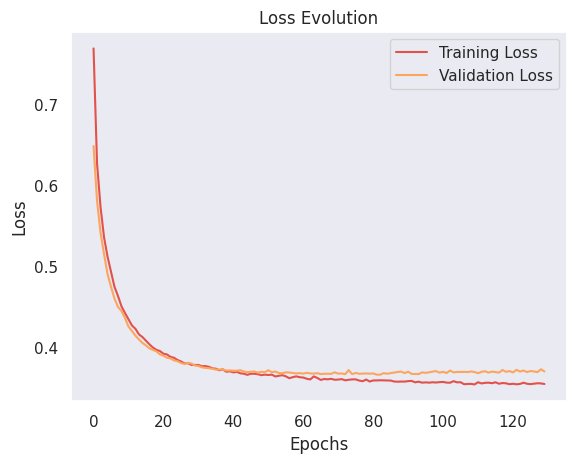

In [ ]:
# Pérdida (Loss)
plt.plot(history_final.history['loss'], label='Training Loss')
plt.plot(history_final.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Evolution')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

Podemos observar que después de agregar la regularización L2 + dropout + optimización del resto de hiperparámetros ya no se observa ruido. Además, obtuvimos una diferencia pequeña de al rededor 2% entre las métricas F1-Score del conjunto de entrenamiento y el de prueba, así que el modelo tiene un buen desempeño general y generaliza bien los datos de prueba, sin presentar sobreajuste. De todas formas no conseguimos una mejora notable en el conjunto de test en comparación a los otros modelos como el realizado en AutoML. Por lo que hemos testeado, no pareciera posible conseguir mejores resultados significativos.

###SHAP

Volvemos a realizar un análisis de explicabilidad pero ahora del modelo neuronal

In [ ]:
feature_names = X_train_cv.columns.values

In [ ]:
# Inicializar el explainer
explainer = shap.DeepExplainer(final_model, X_train_nn)

shap_values = explainer.shap_values(X_test_nn)

In [ ]:
shap_values = np.squeeze(shap_values)

In [ ]:
probabilidades = final_model.predict(X_test_nn)

177/177 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


####Interpretabilidad **Local**

Vamos a analizar los dias que nuestro modelo predice con mayor probabilidad el valor de RainTomorrow. Buscaremos el índice en donde la probabilidad de que pertenezca a la clase 0(False) sea la mayor y haremos lo mismo para la clase 1(True)

In [ ]:
menor_prob_lluvia_idx = np.argmax(probabilidades[:, 0])
menor_prob = probabilidades[menor_prob_lluvia_idx]

print(f"Índice del valor mas grande de probabilidad de pertencencia a clase 0: {menor_prob_lluvia_idx}\nSu probabilidad es: {round(menor_prob[0],3)}%")

Índice del valor mas grande de probabilidad de pertencencia a clase 0: 5572
Su probabilidad es: 0.9559999704360962%


In [ ]:
# Crear la explicación directamente con el valor extraído
explanation = shap.Explanation(
    values=shap_values[menor_prob_lluvia_idx],
    base_values=np.array(explainer.expected_value)[0],
    feature_names=feature_names
)

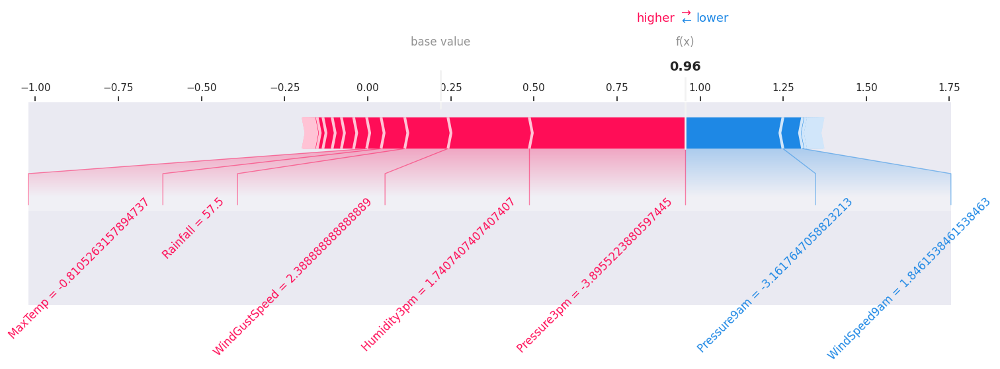

In [ ]:
#inicializar javascript
shap.initjs()

shap.force_plot(np.array(explainer.expected_value)[0], shap_values[menor_prob_lluvia_idx], X_test_nn[menor_prob_lluvia_idx], feature_names = feature_names, matplotlib=True, figsize=(18, 4), text_rotation=45)

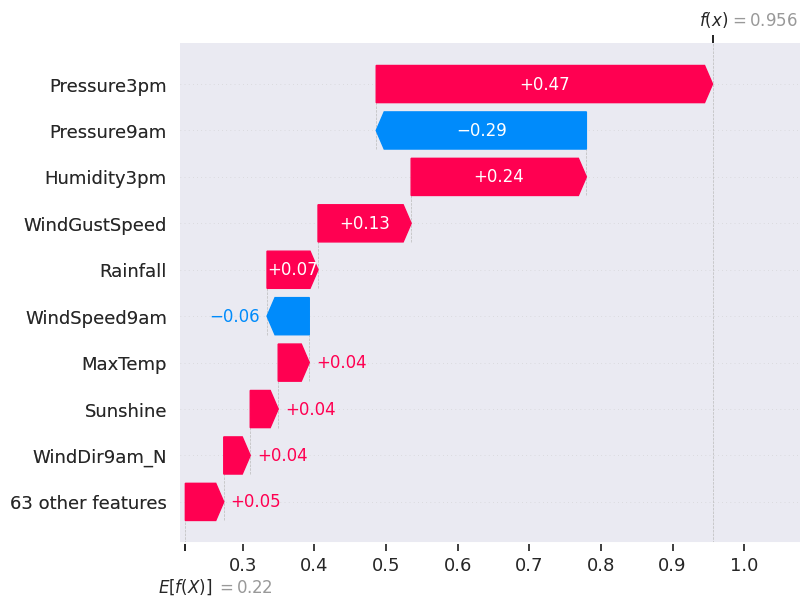

In [ ]:
#waterfall
shap.plots.waterfall(explanation, max_display=10)

De este gráfico podemos analizar el día que nuestro modelo predijo con mas certeza que RainTomorrow tenía valor False. Si lo comparamos con la última vez que usamos shap, se ve que para hacer la predicción le dio mucho peso en general a las mismas variables: presión, humedad y velocidad del viento. El conjunto de presiones fue más importante en este modelo que la humedad. Por otro lado, notamos que si bien le dio importancia a las mismas variables, lo hizo con signos opuestos. Entendemos que esto que vemos pasa porque en los modelos de regresión lineal se capturan relaciones directas y justamente lineales entre las features y la target, asumiendo el impacto de cada variable de forma negativa o positiva de manera general en la predicción, mientras que las redes neuronales no asumen tal linealidad, son más flexibles a la hora de captar relaciones y por ello pueden invertir el efecto de una variable dependiendo de otros factores  o valores que adquieran el resto de las features en la predicción.

In [ ]:
#Ahora realizamos lo mismo para el día que asignó con mayor probabilidad de que RainTomorrow sea True
mayor_prob_lluvia_idx = np.argmin(probabilidades[:, 0])

explanation = shap.Explanation(values=shap_values[mayor_prob_lluvia_idx],
                               base_values=np.array(explainer.expected_value)[0],
                               feature_names=feature_names)

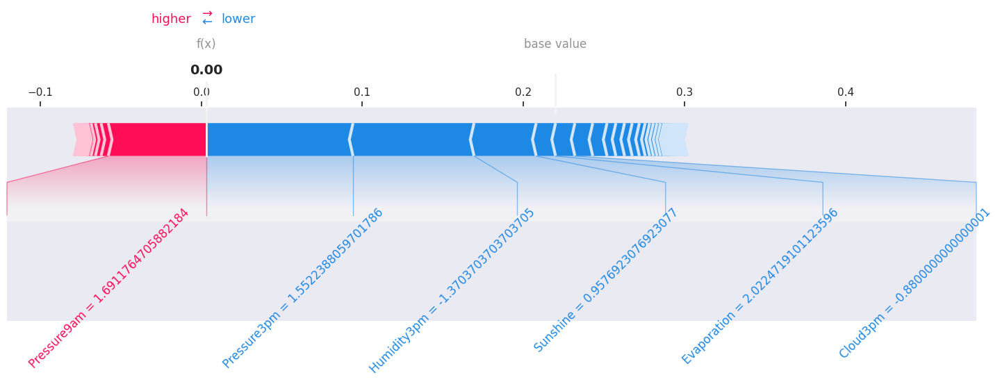

In [ ]:
#inicializar javascript
shap.initjs()
shap.force_plot(np.array(explainer.expected_value)[0], shap_values[mayor_prob_lluvia_idx], X_test_nn[mayor_prob_lluvia_idx], feature_names = feature_names, matplotlib=True, figsize=(18, 4), text_rotation=45)

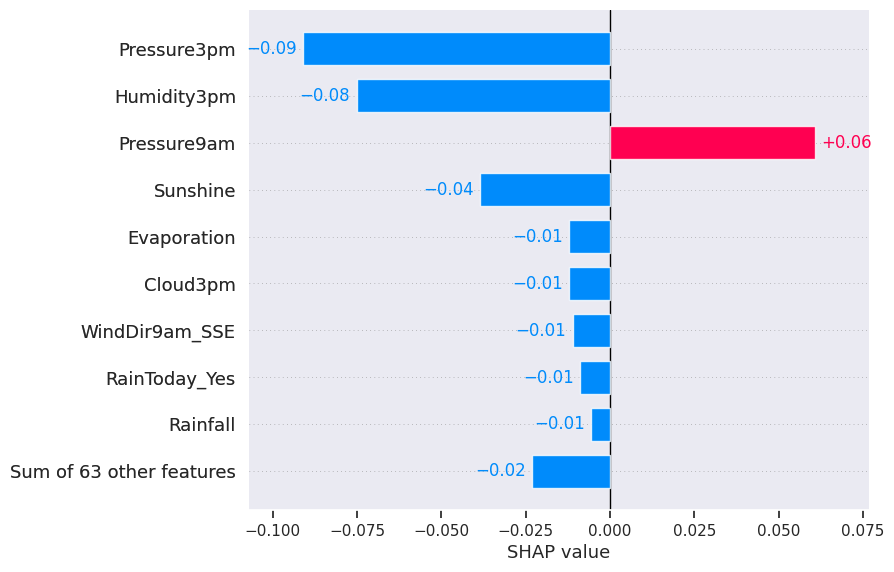

In [ ]:
shap.plots.bar(explanation)

Para el caso donde nuestro modelo asignó con mayor certeza que RainTomorrow es True, a comparación del análisis de shap en RL, volvemos a notar la inversión de signos que nombramos antes. Pero volvió a darle mucha importancia en general a las mismas variables de presion y humedad, con presión siendo la más importante para saber si al otro día llueve. Dejamos de ver velocidad de las ráfagas de viento, y apareció mucho más arriba en su lugar Evaporation. Algo que esperábamos era que la feature Month estuviese presente, sobre todo para predecir cuándo sí es más probable de que llueva mañana.

####Interpretabilidad **Global**

Ahora veremos que variables nuestro modelo considera más importantes cuando se analiza todo el conjunto de prueba entero.

In [ ]:
global_explanation = shap.Explanation(values=shap_values,
                                      base_values=np.array(explainer.expected_value)[0],
                                      feature_names=feature_names,
                                      data=X_test_nn)

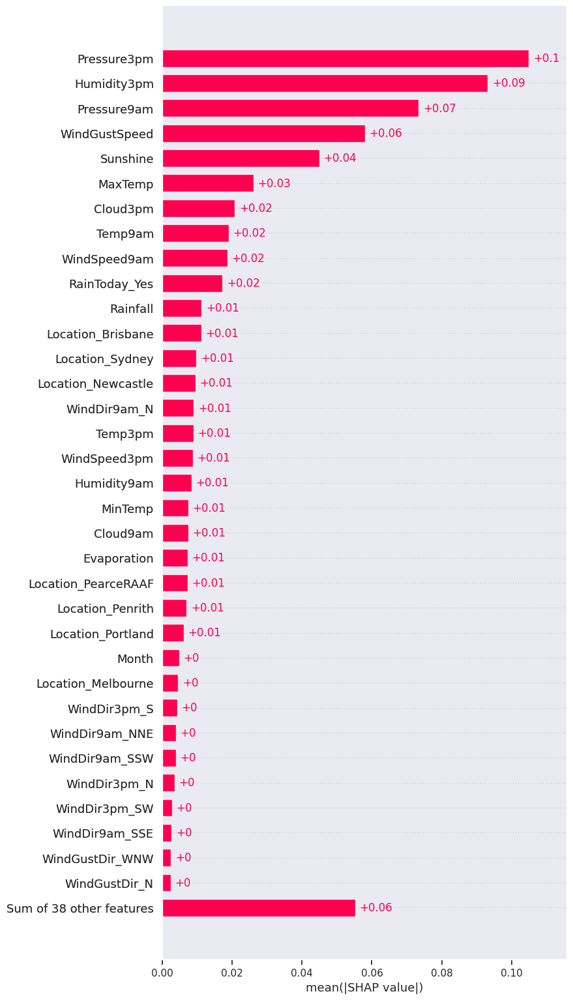

In [ ]:
shap.plots.bar(global_explanation, max_display = 35)

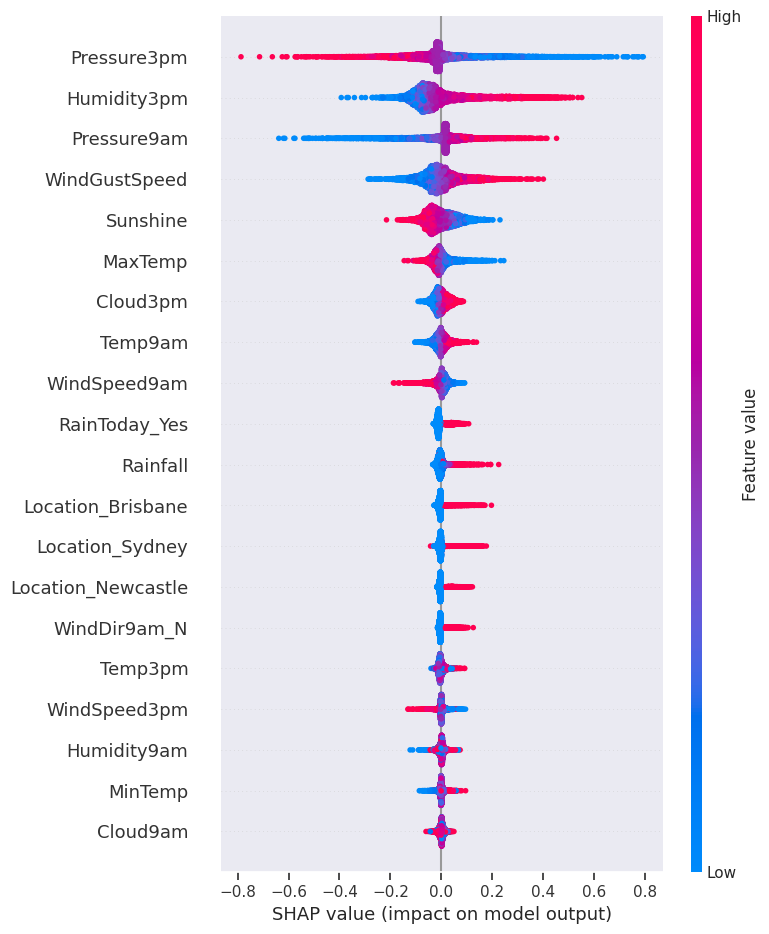

In [ ]:
shap.summary_plot(shap_values, X_test_nn, feature_names=feature_names)

Finalmente, las variables que nuestro modelo considera mas importantes de forma global son: Pressure3pm, Humidity3pm, Pressure9am, WindGustSpeed y Sunshine. Este 'TOP 5' coincide con el que obtuvimos en RL, ambos son de los mejores modelos que obtuvimos y se ve que hay coincidencia en la forma de ponderar las features.

In [ ]:
# Calcula el valor SHAP promedio absoluto para cada característica y muestra las 10 variables con menor valor
mean_shap_values = np.abs(global_explanation.values).mean(axis=0)
shap_val = pd.DataFrame({
    'feature': global_explanation.feature_names,
    'mean_shap_value': mean_shap_values
})
bottom_10 = shap_val.sort_values(by='mean_shap_value').head(10)
print(bottom_10[['feature', 'mean_shap_value']])

            feature  mean_shap_value
42   WindDir9am_ENE         0.000520
67  WindGustDir_SSW         0.000759
36   WindDir3pm_SSE         0.000764
28   WindDir3pm_ESE         0.000790
60   WindGustDir_NE         0.000821
65   WindGustDir_SE         0.000967
68   WindGustDir_SW         0.000974
64    WindGustDir_S         0.000989
30    WindDir3pm_NE         0.001021
71  WindGustDir_WSW         0.001055


Como antes, las variables que menos afectan al modelo son las que se relacionan con la dirección del viento

#Comparación de Modelos y Conclusiones

In [ ]:
#Construimos tabla con todos los modelos vistos y columnas de f1_test y f1_train obtenidas en cada uno
modelos = ['Regresión Logística', 'Modelo Base', 'RL Random Search','RL Optuna','AutoML','Redes Neuronales', 'Redes Neuronales Optuna']
F1_test = [f1_test_lr, f1_test_base, f1_test_lr_rs, f1_test_lr_opt, f1_test_automl, f1_test_nn, f1_test_nn_tuned]
F1_train = [f1_train_lr, f1_train_base, f1_train_lr_rs, f1_train_lr_opt,'-', f1_train_nn, f1_train_nn_tuned]
comparacion_modelos = pd.DataFrame()
comparacion_modelos['Modelo'] = modelos
comparacion_modelos['F1_Test'] = F1_test
comparacion_modelos['F1_Train'] = F1_train


comparacion_modelos

,Modelo,F1_Test,F1_Train
0,Regresión Logística,0.805081,0.811161
1,Modelo Base,0.650600,0.645818
2,RL Random Search,0.805262,0.811161
3,RL Optuna,0.805796,0.811577
4,AutoML,0.843100,-
5,Redes Neuronales,0.820893,0.893233
6,Redes Neuronales Optuna,0.838805,0.861437


- Regresión Logística tiene un buen rendimiento, y como la diferencia entre los datos de train y test no es grande, indica que el modelo está bien ajustado.

- RL Random Search y RL Optuna tienen un rendimiento similar, y aunque fueron modelos optimizados, no mejoraron sobre el modelo inicial. La regresión logística ya estaba bien planteada y evidentemente no hacían falta estas optimizaciones

- Aunque no pudimos obtener F1_train para Light Gradient Boosting Machine	(modelo obtenido de AutoML), es el que más destaca en cuanto a resultados. Sumando que fue rápido de ejecutar y estructurar

- Redes Neuronales aunque no haya podido alcanzar en los datos de test a Light Gradient Boosting Machine, fue muy bueno y superó los resultados de la RL.

- Al optimizar los hiperparámetros en Redes Neuronales con Optuna y agregar la regularización, se pudo mejorar un poco los resultados y reducir las diferencias entre train y test. Este fue el mejor modelo que logramos

- El Modelo Base, para nuestros objetivos, no es competitivo comparado con el resto

Finalmente se nota que los mejores 3 modelos para realizar predicciones de clasificación en este trabajo fueron:

1.   Light Gradient Boosting Machine
2.   Redes Neuronales
3.   Regresión Logística

Sería interesante indagar sobre el modelo que nos presentó AutoML y ver si se puede seguir mejorando al aplicar más optimizaciones o probar nuevas técnicas. Sin embargo, en base a estas métricas que hemos conseguido y que en general rondan el 0.8, podemos decir con bastante confianza que hemos llegado a un tope con este dataset, y que si mejora no lo hará mucho más. Además son resultados que nos satisfacen porque valores que ronden el 0.8 en F1 score nos parece bastante alto.




